# Import Data From Roboflow

In [ ]:
# ============== CODE STARTS HERE! ==============
!pip install roboflow ultralytics
!pip install "sympy<1.13" # New versions, not compatible. So set it this.

from roboflow import Roboflow
rf = Roboflow(api_key="2seZOcizRn4vVMVEAlwn")
project = rf.workspace("gayathry").project("wind-combined")
version = project.version(2)
dataset = version.download("yolov8")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 54.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 74.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 52.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.2/4.2 MB 126.1 MB/s eta 0:00:00
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.12.0.88
    Uninstalling opencv-python-headless-4.12.0.88:
      Successfully uninstalled opencv-python-headless-4.12.0.88
  Attempting uninstall: idna
    Found existing installation: idna 3.11
    Uninstalling idna-3.11:
      Successfully uninstalled idna-3.11
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.7/5.7 MB 58.5 MB/s eta 0:00:00
  Attempting uninstall: sympy
    Found existing installation: sympy 1.14.0
    Uninsta


Extracting Dataset Version Zip to wind-combined-2 in yolov8:: 100%|██████████| 10238/10238 [00:01<00:00, 9867.38it/s]


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


# Import Libraries

In [ ]:
# Import necessary libraries
import os
import numpy as np
import pandas as pd
from pathlib import Path
import cv2
import sympy
import yaml, os, glob, random, shutil

import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
import torch

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from PIL import Image
from ultralytics import YOLO
from IPython.display import Image, display
from collections import Counter
from collections import defaultdict


# Barath's Code

In [ ]:
# DATA VALIDATION:

# PART (1)
# - output damage types
# - output the number of images per folder
yaml_path = os.path.join(dataset.location, "data.yaml")

# Double confirming that data YAML reads fine
with open(yaml_path, "r") as f:
    configuration = yaml.safe_load(f)

print("Classes:", configuration.get("names"))
print("Total Classes:", configuration.get("nc"))

# ====================================
# PART (2)
# - checking the train images to .txt matching
root = dataset.location
for split in ["train", "valid", "test"]:
    i_patt = os.path.join(root, split, "images", "*.jpg")
    t_patt = os.path.join(root, split, "labels", "*.txt")
    imgs = glob.glob(i_patt)
    txts = glob.glob(t_patt)
    print(f"Split: {split}")
    print(f"Number of images: {len(imgs)}")
    print(f"Number of label/text files: {len(txts)}")

print("#===================")
print("All good to train!")

Classes: ['Drain hole impairment', 'Lightning Strike', 'OIL LEAKAGE', 'PU-tape', 'Paint', 'Surface Crack', 'dirt', 'le-erosion']
Total Classes: 8
Split: train
Number of images: 4278
Number of label/text files: 4278
Split: valid
Number of images: 537
Number of label/text files: 537
Split: test
Number of images: 298
Number of label/text files: 298
#===================
All good to train!


In [ ]:
# Load a pretrained model
model = YOLO('yolov8n.pt')     # 'yolov8s.pt' later for better accuracy

In [ ]:
model.train(
    data=f"{dataset.location}/data.yaml",
    epochs=30,
    imgsz=640,       # resize to 640x640
    batch=16,
    device=0         # Request GPU device 0
)

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/wind-combined-2/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, p

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([1, 2, 3, 4, 5, 6, 7])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7fa8d5dc2a50>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
  

In [ ]:
# EVAL: Numeric Metrics

# (1) retrieve the best weights of the model!
model = YOLO("runs/detect/train/weights/best.pt")
metrics = model.val()

# (2) Key performance metrics
print("mAP50-95:", metrics.box.map) # overall accuracy: counts easy + hard cases
print("mAP50:", metrics.box.map50) # how well it finds damage, when not picky
print("mAP75:", metrics.box.map75) # how well it finds damage, when we are picky
print("Precision:", metrics.box.p) # of pred. damages, which were actually damaged
print("Recall:", metrics.box.r) # of real damage spots, how many it found?
print("False alarm rate:", 1 - metrics.box.p) # times it said damage, but wrong
print("Missed damage rate:", 1 - metrics.box.r) # times real damage, but missed

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
Model summary (fused): 72 layers, 3,007,208 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1393.1±380.4 MB/s, size: 34.9 KB)
val: Scanning /content/wind-combined-2/valid/labels.cache... 875 images, 7 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 875/875 2.0Mit/s 0.0s
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 543, len(boxes) = 1129. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 55/55 11.6it/s 4.7s
                   all        875       1129      0.447      0.375      0.369      0.162
      Lightning Strike        154        235      0.427      0.264      0.249     0.0796
           OIL LEAKAGE

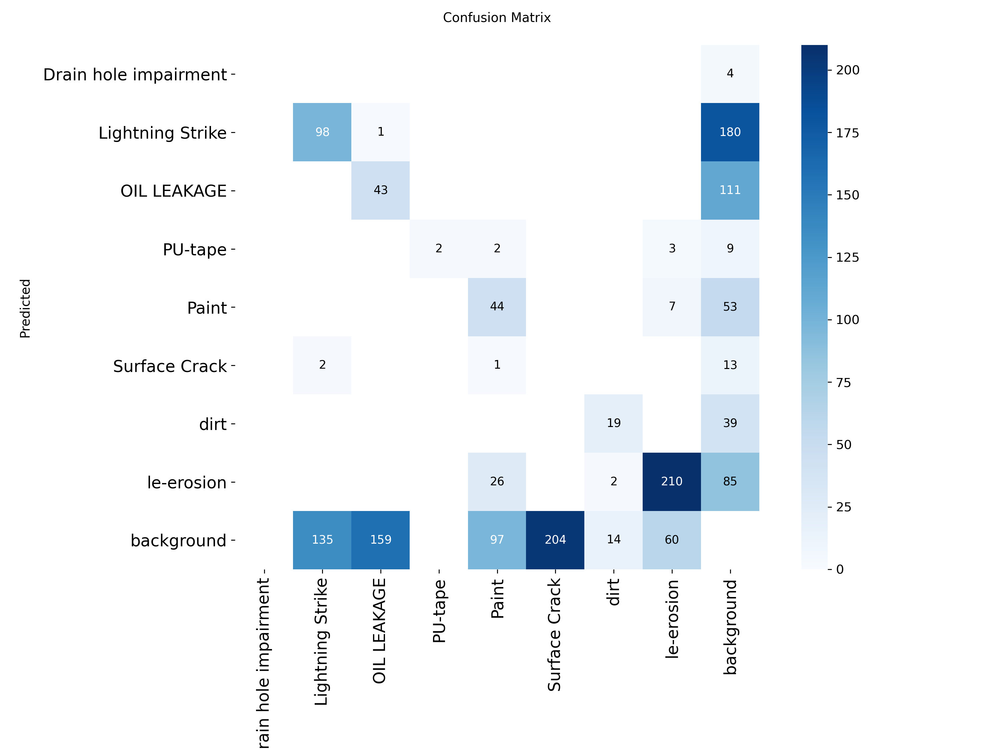

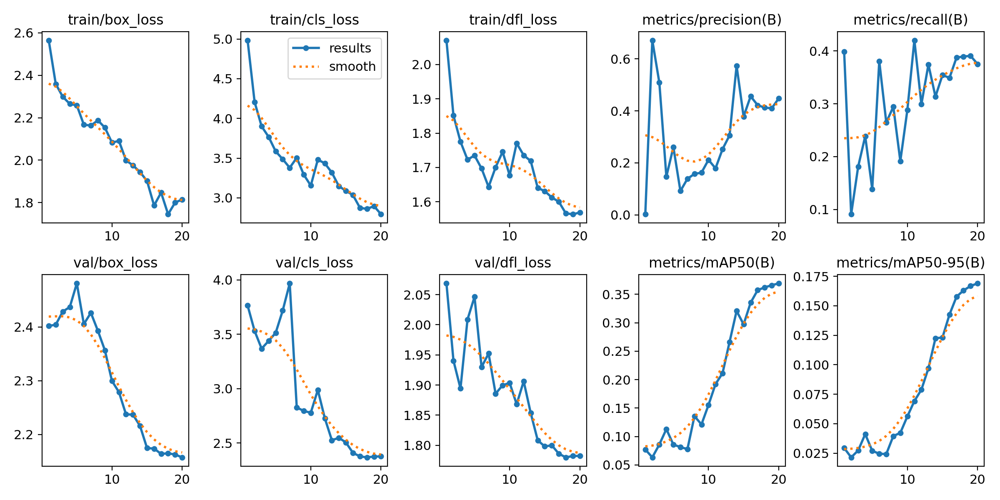

In [ ]:
# EVAL: Visual Metrics

# Since this is YOLO, we actually can find the metrics already stored and print so:

# Following answers: which types of damages did the model mess up?
display(Image(filename='runs/detect/train/confusion_matrix.png', width=600))\
# how model got better over time
display(Image(filename='runs/detect/train/results.png', width=600))


image 1/298 /content/wind-combined-2/test/images/1_JPG_jpg.rf.bacea022c9d9a2050f34456aaa94827e.jpg: 512x512 (no detections), 7.2ms
image 2/298 /content/wind-combined-2/test/images/6_JPG_jpg.rf.7659465caeb075186491732645b96694.jpg: 512x512 (no detections), 6.4ms
image 3/298 /content/wind-combined-2/test/images/ASP01BladeA1704205837_jpg.rf.2f186e2b562c64a8de20ca0299a4b49d.jpg: 512x512 1 le-erosion, 6.4ms
image 4/298 /content/wind-combined-2/test/images/ASP01BladeB1704205761_jpg.rf.2a26e4a08097a14a061133363d408dbb.jpg: 512x512 1 PU-tape, 6.7ms
image 5/298 /content/wind-combined-2/test/images/ASP01BladeB1704205832_jpg.rf.1a7d624a9982b3965e25d42164baf0b7.jpg: 512x512 1 le-erosion, 6.4ms
image 6/298 /content/wind-combined-2/test/images/ASP01BladeC1704205824_jpg.rf.fdfb99b30d7930206f6f637602566d71.jpg: 512x512 1 le-erosion, 6.3ms
image 7/298 /content/wind-combined-2/test/images/ASP02BladeA1704205898_jpg.rf.e7ef423963d218ae548ecf28dba18484.jpg: 512x512 (no detections), 6.3ms
image 8/298 /cont

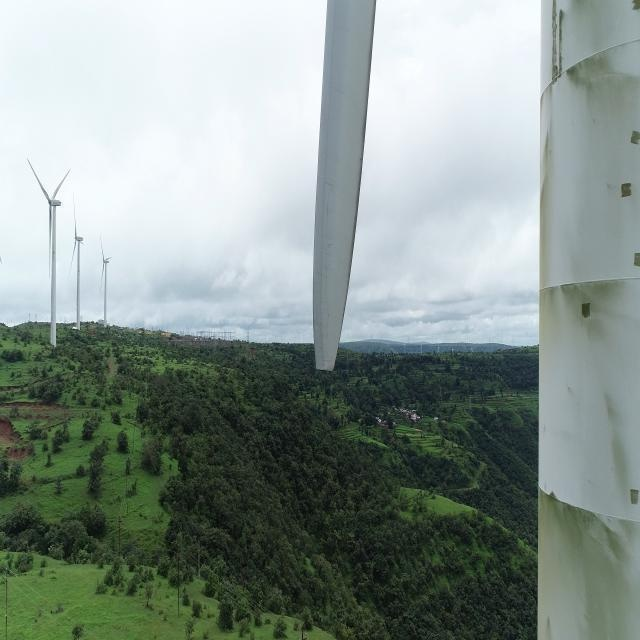

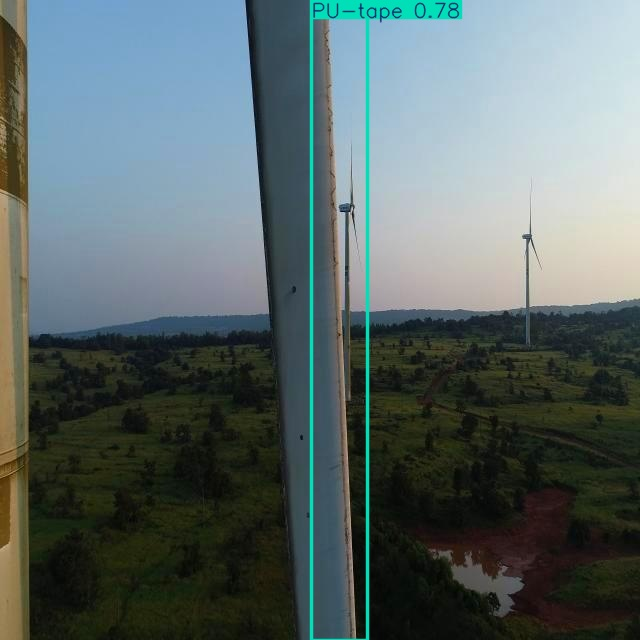

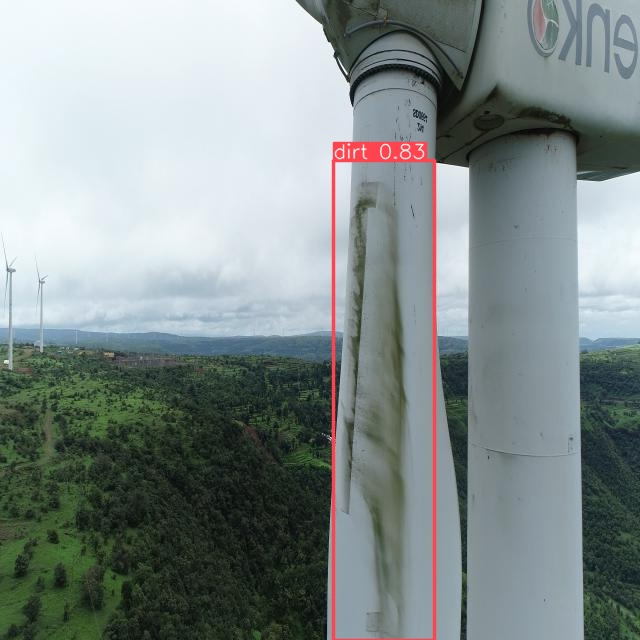

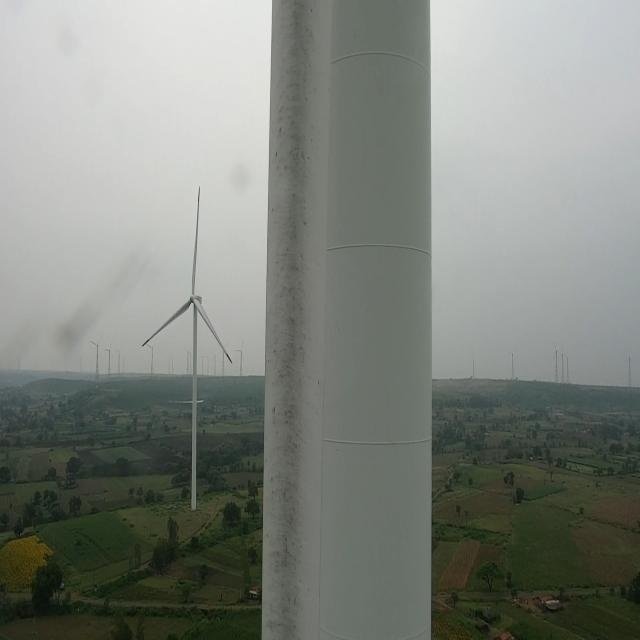

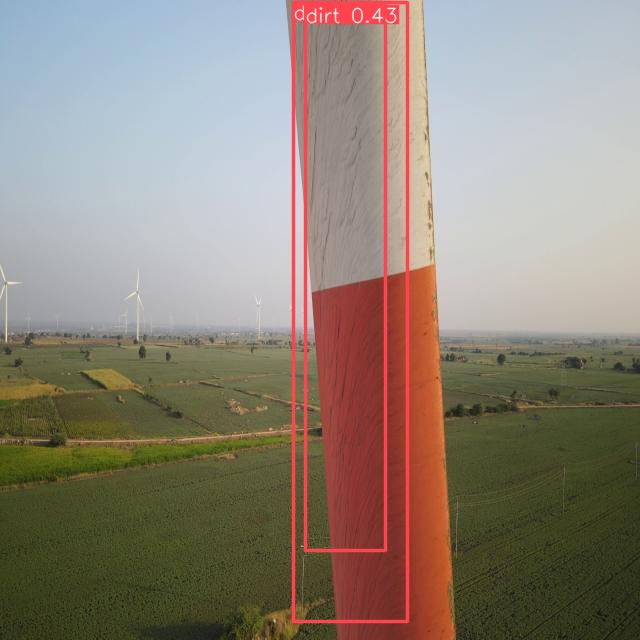

In [ ]:
# EVAL: Run on Test Set, and actually see it. This is most important for us!

# Via the CV model, each image now gets:
# - a colored box around each damage spot
# - the name of the damage (like “Surface Crack” or “Oil Leakage”)
results = model.predict(source=f"{dataset.location}/test/images", conf=0.4, save=True)

# Now let's see them:
predicted_imgs = glob.glob("runs/detect/predict/*.jpg")
# Im limiting to only see 5 images here:
for img in predicted_imgs[:5]:
    display(Image(filename=img, width=600))

In [ ]:
# Confusion Matrix makes me thing we have dataset imbalance. Let us check:

label_dir = "wind-combined-2/train/labels"

count = Counter()
for file in os.listdir(label_dir):
  if file.endswith(".txt"):
    with open(os.path.join(label_dir, file), "r") as f:
      for line in f:
        cls = int(line.split()[0])
        count[cls] += 1

names = model.names
for cls_id, num in sorted(count.items()):
  print(f"{names[cls_id]}: {num}")

Drain hole impairment: 6
Lightning Strike: 312
OIL LEAKAGE: 720
PU-tape: 280
Paint: 1204
Surface Crack: 603
dirt: 552
le-erosion: 1912


This is very bad dataset imbalance actually!

In [ ]:
# Technique: Oversample on the 3 most rare:
# Drain hole impairment, Lightning Strike, and Surface Crack

# If we oversample on too much, we actually can mess up precision btw!

import os, shutil, random

# what we have right now
data_dir = "wind-combined-2/train"
img_dir = os.path.join(data_dir, "images")
lbl_dir = os.path.join(data_dir, "labels")

# where I want duplicate files stored.
aug_dir = os.path.join(data_dir, "augmented")
# aug data folders (images + labels, cuz we had that before)
os.makedirs(os.path.join(aug_dir, "images"), exist_ok=True)
os.makedirs(os.path.join(aug_dir, "labels"), exist_ok=True)

# LOGIC:
# store the top 3 rare damages
rare_classes = [0,1,5]
duplicate_factor = 10 # im doing a multipler by 10

# specifically: (1 + duplicate_factor)

# go through every label file in the dataset
for file in os.listdir(lbl_dir):
  if not file.endswith(".txt"):
    continue
  if file.endswith(".txt"): # i only worry about the label files
    with open(os.path.join(lbl_dir, file)) as f:
      lines = f.readlines()
  # Just get first number (cuz of .txt format), check if it's rare
  if any(int(line.split()[0]) in rare_classes for line in lines):
    imgf = file.replace(".txt", ".jpg")

    # Okay let me duplicate now so:
    for i in range(duplicate_factor):
      # adding prefix to distinguish
      new_lbl = f"{i}_{file}"
      new_img = f"{i}_{imgf}"

      # put all new into the augmented folder:
      # the code just follows "shutil.copy(src, dst)"
      shutil.copy(os.path.join(lbl_dir, file), os.path.join(aug_dir, "labels", new_lbl))
      shutil.copy(os.path.join(img_dir, imgf), os.path.join(aug_dir, "images", new_img))

print("Oversampling done.")


Oversampling done.


In [ ]:
# Now that we have made the actual folders, just merge into train.
# because we "train" on the train set, and we are modifying it at the EOD.
# So:
data_dir = "wind-combined-2/train"
# the following is actually temporary btw:
aug_dir = os.path.join(data_dir, "augmented")

if os.path.exists(aug_dir):
  for sub in ["images", "labels"]:
    src = os.path.join(aug_dir, sub)
    dst = os.path.join(data_dir, sub)
    for f in os.listdir(src):
      # each dup file goes into the official /images and /labels
      shutil.move(os.path.join(src, f), os.path.join(dst, f))
      # augmented folder will now be empty!

In [ ]:
# Did oversampling work?
# Written using data.yaml so can run indepedent!

import os, yaml
from collections import Counter

# dataset label folder
label_dir = "wind-combined-2/train/labels"

# class names from data.yaml (instead of model to run independent)
with open("wind-combined-2/data.yaml", "r") as f:
  names = yaml.safe_load(f)["names"]

count = Counter()
for file in os.listdir(label_dir):
  if file.endswith(".txt"):
    with open(os.path.join(label_dir, file)) as f:
      for line in f:
        if line.strip(): # not needed, but safety to strip empty
          # we know the first number = class ID so let's get that
          cls = int(line.split()[0])
          count[cls] += 1 # just count

for cls_id, num in sorted(count.items()):
  print(f"{names[cls_id]}: {num}")

Drain hole impairment: 66
Lightning Strike: 330
OIL LEAKAGE: 278
PU-tape: 280
Paint: 1244
Surface Crack: 1144
dirt: 552
le-erosion: 1912


In [ ]:
# Now let's train a much better model:

# This is a lightly better model actually.
model = YOLO("yolov8s.pt")

results = model.train(
    data=f"{dataset.location}/data.yaml",
    imgsz=800, # edited to detect more smaller cracks
    epochs=60,
    batch=16,
    device=0,
    seed=42,
    cos_lr=True,
    patience=15,
    verbose=True,
)

print("training is done.")

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/wind-combined-2/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=60, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=800, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=15, perspective=0.0, plot

In [ ]:
import os

print(os.listdir("runs/detect"))


['train']


In [ ]:
# Evaluations can be done. These are the same code from above repeated!

# =================== EVAL CODE REPEATED 1 ===================
# EVAL: Numeric Metrics

# (1) retrieve the best weights of the model!
model = YOLO("runs/detect/train/weights/best.pt")
metrics = model.val()

# (2) Key performance metrics
print("mAP50-95:", metrics.box.map) # overall accuracy: counts easy + hard cases
print("mAP50:", metrics.box.map50) # how well it finds damage, when not picky
print("mAP75:", metrics.box.map75) # how well it finds damage, when we are picky
print("Precision:", metrics.box.p) # of pred. damages, which were actually damaged
print("Recall:", metrics.box.r) # of real damage spots, how many it found?
print("False alarm rate:", 1 - metrics.box.p) # times it said damage, but wrong
print("Missed damage rate:", 1 - metrics.box.r) # times real damage, but missed


Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
Model summary (fused): 72 layers, 11,128,680 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1151.6±233.5 MB/s, size: 31.2 KB)
val: Scanning /content/wind-combined-2/valid/labels.cache... 537 images, 7 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 537/537 1.2Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 34/34 8.1it/s 4.2s
                   all        537        543      0.741      0.659      0.683      0.455
      Lightning Strike          8          8       0.79      0.625      0.675      0.459
           OIL LEAKAGE         30         32      0.818      0.906      0.898      0.667
               PU-tape          2          2      0.859          1      0.995      0.921
                 Paint        162        170      0.583      0.476      0.492      0.211
         Surface Crack     

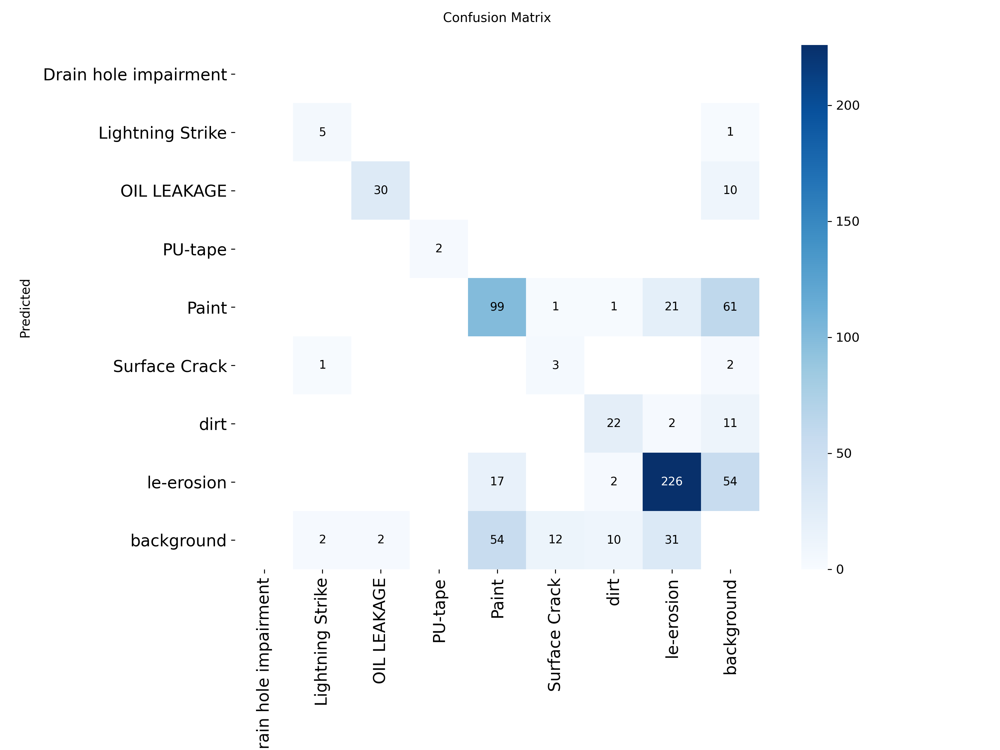

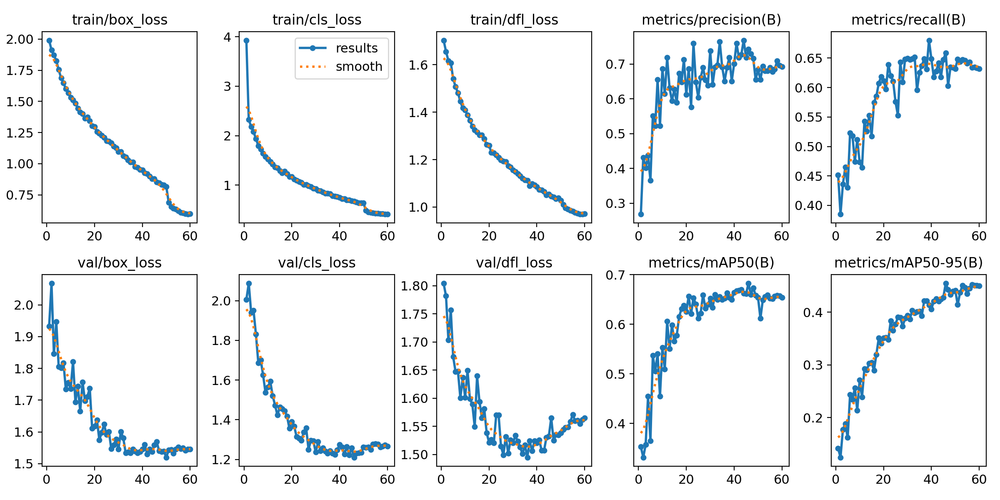

In [ ]:
# =================== EVAL CODE REPEATED 2 ===================
# EVAL: Visual Metrics

# Since this is YOLO, we actually can find the metrics already stored and print so:

# Following answers: which types of damages did the model mess up?
display(Image(filename='runs/detect/train/confusion_matrix.png', width=600))\
# how model got better over time
display(Image(filename='runs/detect/train/results.png', width=600))



image 1/298 /content/wind-combined-2/test/images/1_JPG_jpg.rf.bacea022c9d9a2050f34456aaa94827e.jpg: 800x800 1 OIL LEAKAGE, 6.8ms
image 2/298 /content/wind-combined-2/test/images/6_JPG_jpg.rf.7659465caeb075186491732645b96694.jpg: 800x800 (no detections), 7.1ms
image 3/298 /content/wind-combined-2/test/images/ASP01BladeA1704205837_jpg.rf.2f186e2b562c64a8de20ca0299a4b49d.jpg: 800x800 1 le-erosion, 6.7ms
image 4/298 /content/wind-combined-2/test/images/ASP01BladeB1704205761_jpg.rf.2a26e4a08097a14a061133363d408dbb.jpg: 800x800 1 Paint, 6.5ms
image 5/298 /content/wind-combined-2/test/images/ASP01BladeB1704205832_jpg.rf.1a7d624a9982b3965e25d42164baf0b7.jpg: 800x800 1 le-erosion, 6.5ms
image 6/298 /content/wind-combined-2/test/images/ASP01BladeC1704205824_jpg.rf.fdfb99b30d7930206f6f637602566d71.jpg: 800x800 1 le-erosion, 6.5ms
image 7/298 /content/wind-combined-2/test/images/ASP02BladeA1704205898_jpg.rf.e7ef423963d218ae548ecf28dba18484.jpg: 800x800 1 Surface Crack, 6.7ms
image 8/298 /content/

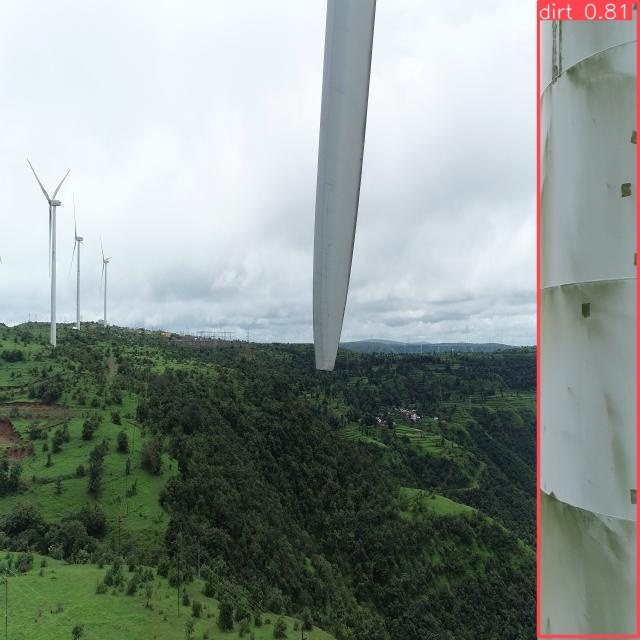

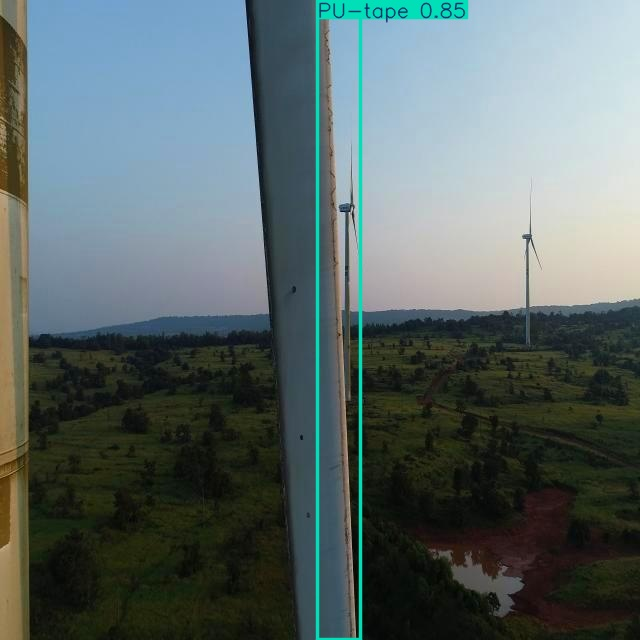

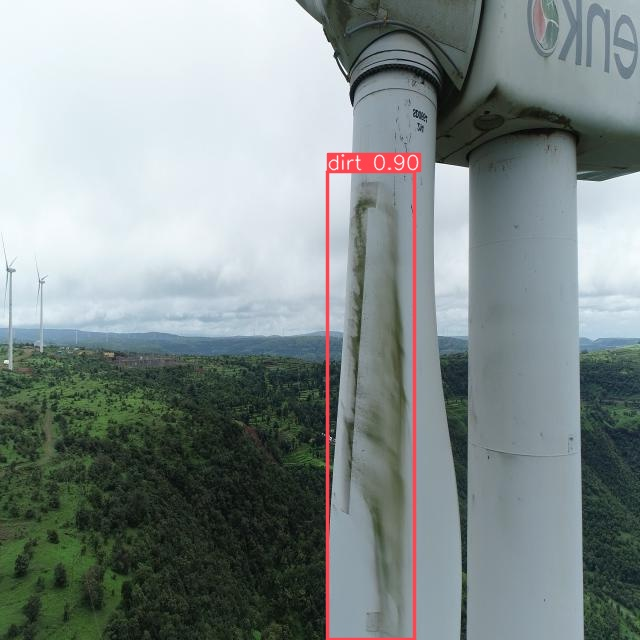

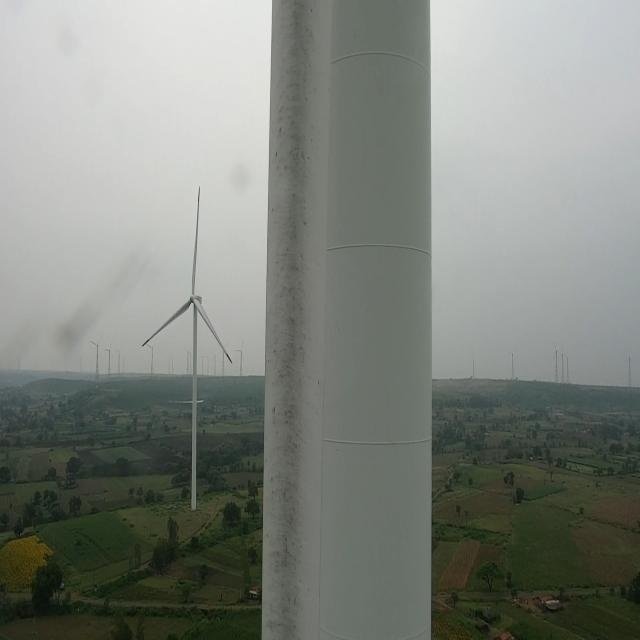

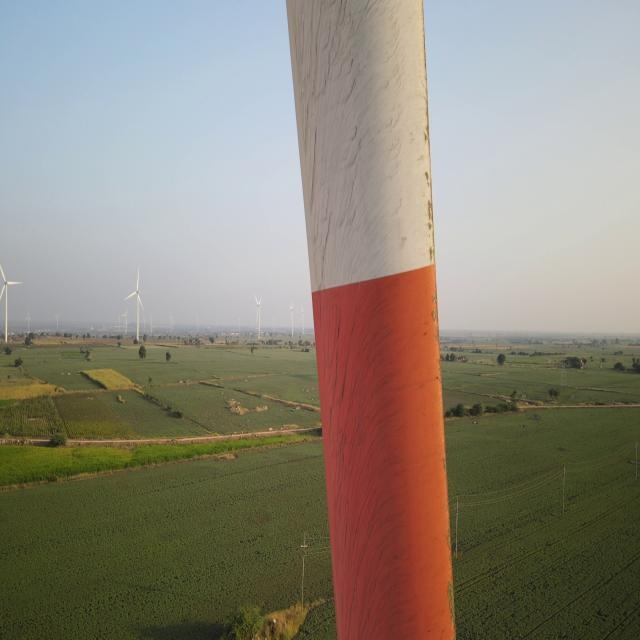

In [ ]:
# =================== EVAL CODE REPEATED 3 ===================
# EVAL: Run on Test Set, and actually see it. This is most important for us!

# Via the CV model, each image now gets:
# - a colored box around each damage spot
# - the name of the damage (like “Surface Crack” or “Oil Leakage”)
results = model.predict(source=f"{dataset.location}/test/images", conf=0.4, save=True)

# Now let's see them:
predicted_imgs = glob.glob("runs/detect/predict/*.jpg")
# Im limiting to only see 5 images here:
for img in predicted_imgs[:5]:
    display(Image(filename=img, width=600))

# Ayela's Code:

- First, I created a small, balanced subset by taking roughly
equal numbers of images that contain each class (except drain hole impairment has hardly any images so I only used 6 of those and only 30 of lightning strike)
- The baseline YOLOv8n model had ok accuracy for PU-tape, le-erosion, oil leakage, dirt but bad accuracy for lightning and paint and basically got ALL of surface crack and drain hole incorrect. This adds up for drain hole but is weird for surface crack-- it keeps conflating that with other categories.
- The first model hadn't converged so I trained some more with more epochs and better resolution. The idea is to overfit the small subset as much as possible via hyperparameter tuning

In [ ]:
# Define subset folders
root = Path(dataset.location)

# Paths
train_img_dir = root / "train/images"
train_lbl_dir = root / "train/labels"
subset_img = root / "train_small/images"
subset_lbl = root / "train_small/labels"
subset_img.mkdir(parents=True, exist_ok=True)
subset_lbl.mkdir(parents=True, exist_ok=True)

# Read class names from YAML
import yaml
with open(root / "data.yaml") as f:
    data_yaml = yaml.safe_load(f)
classes = data_yaml["names"]
num_classes = len(classes)
print(f"Detected {num_classes} classes:", classes)

# Build mapping: class_id -> list of (img_path, lbl_path)
images_by_class = defaultdict(list)
for lbl_path in train_lbl_dir.glob("*.txt"):
    with open(lbl_path) as f:
        lines = f.readlines()
    if not lines:
        continue
    # Extract all class IDs appearing in this label file
    class_ids = {int(line.strip().split()[0]) for line in lines}
    img_path = train_img_dir / (lbl_path.stem + ".jpg")
    if not img_path.exists():
        img_path = train_img_dir / (lbl_path.stem + ".png")
    for cid in class_ids:
        images_by_class[cid].append((img_path, lbl_path))

# Choose equal number of images per class
target_per_class = 40   # adjust smaller/larger based on total size
subset_pairs = set()

for cid, pairs in images_by_class.items():
    random.shuffle(pairs)
    take = min(target_per_class, len(pairs))
    subset_pairs.update(pairs[:take])
    print(f"Class {cid} ({classes[cid]}): taking {take} images")

# Copy selected files into train_small/
for img_path, lbl_path in subset_pairs:
    shutil.copy(img_path, subset_img / img_path.name)
    shutil.copy(lbl_path, subset_lbl / lbl_path.name)

print(f"Balanced subset created with {len(subset_pairs)} total images.")



Detected 8 classes: ['Drain hole impairment', 'Lightning Strike', 'OIL LEAKAGE', 'PU-tape', 'Paint', 'Surface Crack', 'dirt', 'le-erosion']
Class 1 (Lightning Strike): taking 40 images
Class 7 (le-erosion): taking 40 images
Class 4 (Paint): taking 40 images
Class 6 (dirt): taking 40 images
Class 5 (Surface Crack): taking 40 images
Class 3 (PU-tape): taking 40 images
Class 2 (OIL LEAKAGE): taking 40 images
Class 0 (Drain hole impairment): taking 40 images
Balanced subset created with 320 total images.


In [ ]:
# Create a YAML file for the balanced subset
yaml_balanced = root / "data_balanced.yaml"

with open(root / "data.yaml") as f:
    orig_yaml = yaml.safe_load(f)

# Reuse val/test sets, but point train to train_small/
orig_yaml["train"] = "train_small/images"
orig_yaml["val"] = "valid/images"

with open(yaml_balanced, "w") as f:
    yaml.dump(orig_yaml, f)

print("Balanced subset YAML created:", yaml_balanced)

# Load the YOLO model (nano variant for quick run)
model_balanced = YOLO("yolov8n.pt")

# Train the model (short, fast run)
results = model_balanced.train(
    data=str(yaml_balanced),  # path to YAML
    imgsz=512,                # smaller image size for speed
    epochs=20,                # short run for quick iteration
    batch=8,
    device=0,
    cache=True,               # cache images for faster training
    cos_lr=True,              # cosine learning rate
    patience=5,               # early stopping
    seed=42
)

print("\n Training complete. Model saved in:", results.save_dir)

# Evaluate on the same subset
metrics = model_balanced.val(data=str(yaml_balanced))
print("\n Evaluation on balanced subset:")
print("mAP50-95:", metrics.box.map)
print("Precision:", metrics.box.p)
print("Recall:", metrics.box.r)



Balanced subset YAML created: /content/wind-combined-2/data_balanced.yaml
Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=True, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/wind-combined-2/data_balanced.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=512, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, opt

In [ ]:
import os

print(os.listdir("runs/detect"))

['val', 'train2', 'val2', 'predict', 'train']


In [ ]:
# visualize model predictions on the validation set

# run predictions on a few validation images
results = model_balanced.predict(source="/content/wind-combined-2/valid/images", conf=0.4, save=True)

# show a few results in Colab
for img_path in glob.glob("/content/runs/detect/predict/*.jpg")[:5]:
    display(Image(filename=img_path, width=500))


In [ ]:
# reinitialize model
model_balanced = YOLO("/content/runs/detect/train2/weights/last.pt")

# resume training with more epochs + better resolution because model had not yet converged
model_balanced2 = model_balanced.train(
    data="/content/wind-combined-2/data_balanced.yaml",
    epochs=20,          # add another 20 epochs
    imgsz=640,          # higher resolution
    batch=8,
    device=0,
    resume=False,
    cos_lr=True,
    seed=42,
    save=True,
    project="/content/runs/detect",  # save under same folder
    name="train_finetune"            # name of this fine-tuning run
)


Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/wind-combined-2/data_balanced.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/runs/detect/train2/weights/last.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train_finetune, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, ove

In [ ]:
print(os.listdir("runs/detect"))

['val', 'train_finetune', 'train2', 'val2', 'predict', 'train']


In [ ]:
# EVAL: Numeric Metrics

# (1) retrieve the best weights of the model!
model = YOLO("runs/detect/train_finetune/weights/best.pt")
metrics = model.val()

# (2) Key performance metrics
print("mAP50-95:", metrics.box.map) # overall accuracy: counts easy + hard cases
print("mAP50:", metrics.box.map50) # how well it finds damage, when not picky
print("mAP75:", metrics.box.map75) # how well it finds damage, when we are picky
print("Precision:", metrics.box.p) # of pred. damages, which were actually damaged
print("Recall:", metrics.box.r) # of real damage spots, how many it found?
print("False alarm rate:", 1 - metrics.box.p) # times it said damage, but wrong
print("Missed damage rate:", 1 - metrics.box.r) # times real damage, but missed

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
Model summary (fused): 72 layers, 3,007,208 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1188.1±392.8 MB/s, size: 31.5 KB)
val: Scanning /content/wind-combined-2/valid/labels.cache... 537 images, 7 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 537/537 1.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 34/34 9.7it/s 3.5s
                   all        537        543      0.369       0.48      0.401      0.192
      Lightning Strike          8          8      0.268      0.625      0.251      0.121
           OIL LEAKAGE         30         32      0.384      0.781      0.521       0.24
               PU-tape          2          2      0.347        0.5      0.695      0.423
                 Paint        162        170      0.412      0.124       0.16     0.0499
         Surface Crack       

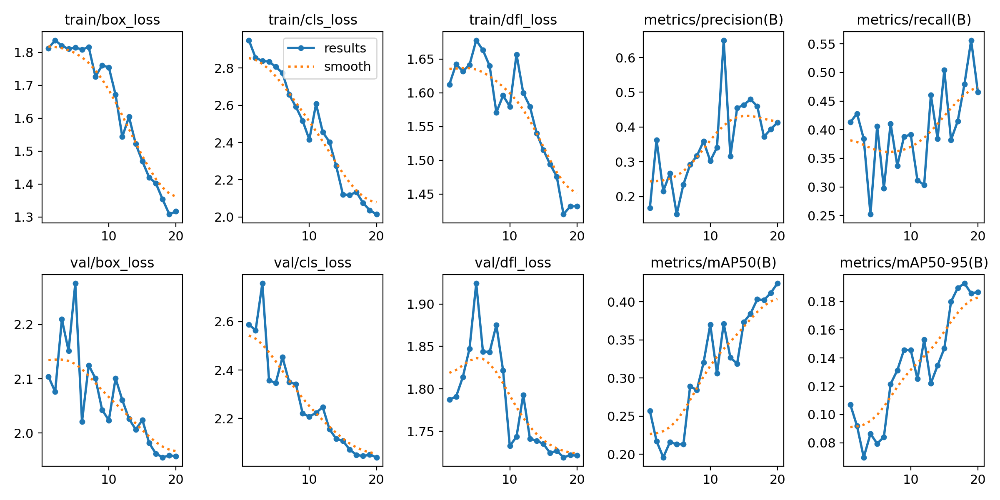

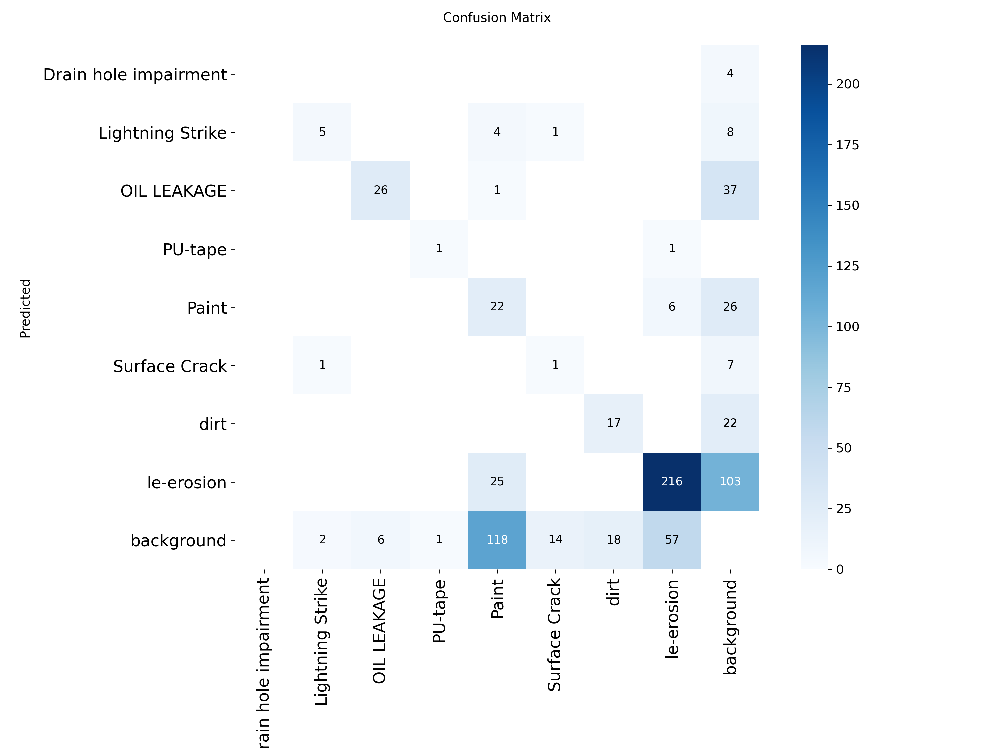

In [ ]:
display(Image('/content/runs/detect/train_finetune/results.png', width=600))
display(Image('/content/runs/detect/train_finetune/confusion_matrix.png', width=600))

In [ ]:
# Load fine-tuned weights
model_balanced2 = YOLO("/content/runs/detect/train_finetune/weights/best.pt")

# Run prediction on the validation set and save all outputs
results = model_balanced2.predict(
    source="/content/wind-combined-2/valid/images",  # validation folder
    conf=0.1,            # lower threshold to catch weak detections
    save=True,           # save annotated images
    save_txt=True,       # save YOLO-format label files
    save_conf=True,      # include confidence column
    name="predict_finetune"  # new folder name under /runs/detect
)


image 1/537 /content/wind-combined-2/valid/images/15_JPG_jpg.rf.4ee9df6d8d3af70259016144d74f262c.jpg: 640x640 1 le-erosion, 6.7ms
image 2/537 /content/wind-combined-2/valid/images/15_JPG_jpg.rf.654a0aa9378985e27a1a5705ef445a64.jpg: 640x640 1 le-erosion, 6.7ms
image 3/537 /content/wind-combined-2/valid/images/ASP01BladeA1704205811_jpg.rf.e621be8db4a64fea655b8105096c1f56.jpg: 640x640 1 OIL LEAKAGE, 1 dirt, 6.6ms
image 4/537 /content/wind-combined-2/valid/images/ASP01BladeA1704205834_jpg.rf.b567bbf02af00331698f3684531a92a2.jpg: 640x640 1 le-erosion, 6.6ms
image 5/537 /content/wind-combined-2/valid/images/ASP02BladeA1704205950_jpg.rf.841139cbec75f1a72e6e5e2e63eb9eec.jpg: 640x640 2 le-erosions, 6.6ms
image 6/537 /content/wind-combined-2/valid/images/ASP02BladeA1704205960_jpg.rf.6e9b7504684739728bac83821ec3291f.jpg: 640x640 (no detections), 6.6ms
image 7/537 /content/wind-combined-2/valid/images/ASP02BladeB1704205949_jpg.rf.5e0eb205410b868f8a49929425bf4af8.jpg: 640x640 2 le-erosions, 6.5ms


In [ ]:
# Paths
pred_path = "/content/runs/detect/predict_finetune/labels"
true_path = "/content/wind-combined-2/valid/labels"

# same order as training config
class_names = [
    "Drain hole impairment",
    "Lightning Strike",
    "OIL LEAKAGE",
    "PU-tape",
    "Paint",
    "Surface Crack",
    "dirt",
    "le-erosion"
]

# Initialize confusion matrix
n_classes = len(class_names)
conf_matrix = np.zeros((n_classes, n_classes), dtype=int)

# Build confusion matrix
for pred_file in glob.glob(pred_path + "/*.txt"):
    fname = os.path.basename(pred_file)
    true_file = os.path.join(true_path, fname)
    if not os.path.exists(true_file):
        continue

    with open(pred_file) as pf, open(true_file) as tf:
        preds = [int(line.split()[0]) for line in pf]
        trues = [int(line.split()[0]) for line in tf]

    # Count true labels
    true_counts = Counter(trues)
    pred_counts = Counter(preds)

    # For each true label, add predicted label counts
    for t_class, t_count in true_counts.items():
        for p_class, p_count in pred_counts.items():
            conf_matrix[t_class, p_class] += min(t_count, p_count)

# Convert to DataFrame for readability
df_conf = pd.DataFrame(conf_matrix, index=class_names, columns=class_names)
df_conf.index.name = "True / Predicted"
print("Confusion matrix:")
df_conf



Confusion matrix:


,Drain hole impairment,Lightning Strike,OIL LEAKAGE,PU-tape,Paint,Surface Crack,dirt,le-erosion
True / Predicted,,,,,,,,
Drain hole impairment,0,0,0,0,0,0,0,0
Lightning Strike,0,5,0,0,0,2,0,1
OIL LEAKAGE,0,0,32,2,0,0,2,0
PU-tape,1,0,0,1,0,0,0,0
Paint,6,18,15,1,49,9,15,38
Surface Crack,0,1,0,0,0,5,3,1
dirt,0,1,3,2,3,1,23,2
le-erosion,0,0,1,8,7,5,1,268


In [ ]:
import os
from pathlib import Path
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import yaml

# ---- Paths ----
root = Path("/content/wind-combined-2")
pred_dir = Path("/content/runs/detect/predict_finetune")
val_img_dir = root / "valid/images"
val_lbl_dir = root / "valid/labels"

# ---- Load class names ----
with open("/content/wind-combined-2/data_balanced.yaml") as f:
    data_yaml = yaml.safe_load(f)
class_names = data_yaml["names"]

confusions = {}

for label_file in sorted(val_lbl_dir.glob("*.txt")):
    img_name = label_file.stem + ".jpg"
    img_path = val_img_dir / img_name

    # ---- TRUE LABEL ----
    with open(label_file) as f:
        line = f.readline().strip().split()

    # Skip empty-label images (background)
    if len(line) == 0:
        # print("Skipping empty label file:", label_file.name)
        continue

    true_cls = int(line[0])

    # ---- PREDICTIONS ----
    pred_file = pred_dir / "labels" / label_file.name
    if not pred_file.exists():
        continue

    preds = []
    with open(pred_file) as f:
        for ln in f.readlines():
            parts = ln.strip().split()
            pred_cls = int(parts[0])
            conf = float(parts[-1])
            preds.append((pred_cls, conf))

    if len(preds) == 0:
        continue

    pred_cls = max(preds, key=lambda x: x[1])[0]

    confusions.setdefault((true_cls, pred_cls), []).append(str(img_path))

print("✔ Confusion dictionary created with", len(confusions), "true→pred pairs")

✔ Confusion dictionary created with 28 true→pred pairs


In [ ]:
def show_confusion(true_label, pred_label, max_imgs=12):
    key = (true_label, pred_label)
    if key not in confusions:
        print(f"No confusion images for True='{class_names[true_label]}' → Pred='{class_names[pred_label]}'")
        return

    imgs = confusions[key][:max_imgs]
    n = len(imgs)

    cols = 4
    rows = (n + cols - 1) // cols

    plt.figure(figsize=(16, 4 * rows))
    plt.suptitle(f"True: {class_names[true_label]} → Predicted: {class_names[pred_label]} ({n} samples)",
                 fontsize=16)

    for i, img_path in enumerate(imgs):
        img = Image.open(img_path)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

    plt.show()


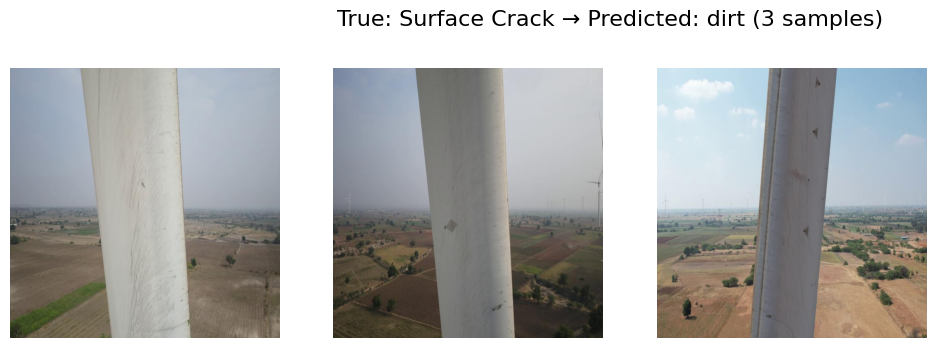

In [ ]:
show_confusion(class_names.index("Surface Crack"), class_names.index("dirt"))


In [ ]:
show_confusion(class_names.index("Surface Crack"), class_names.index("Paint"))


No confusion images for True='Surface Crack' → Pred='Paint'


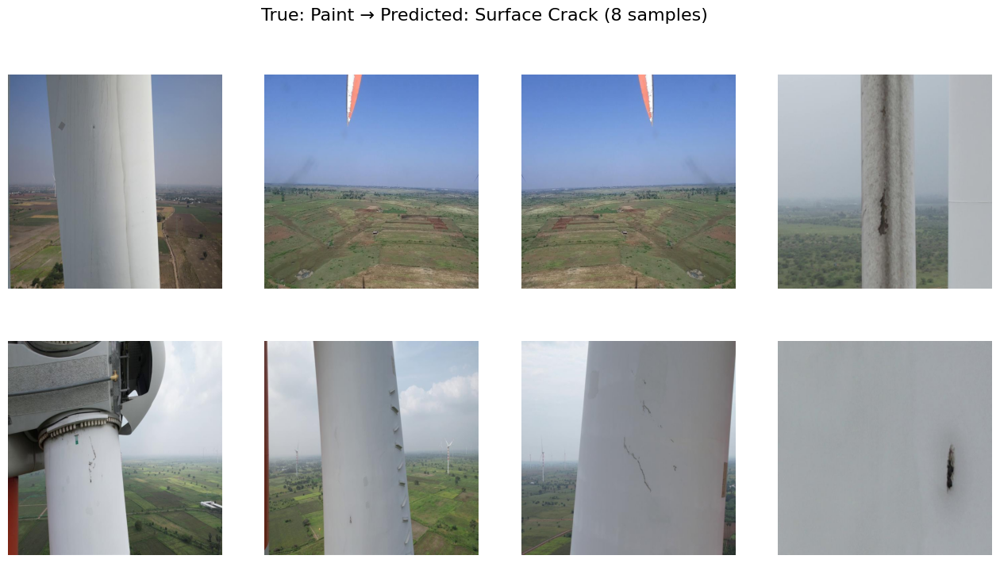

In [ ]:
show_confusion(class_names.index("Paint"), class_names.index("Surface Crack"))


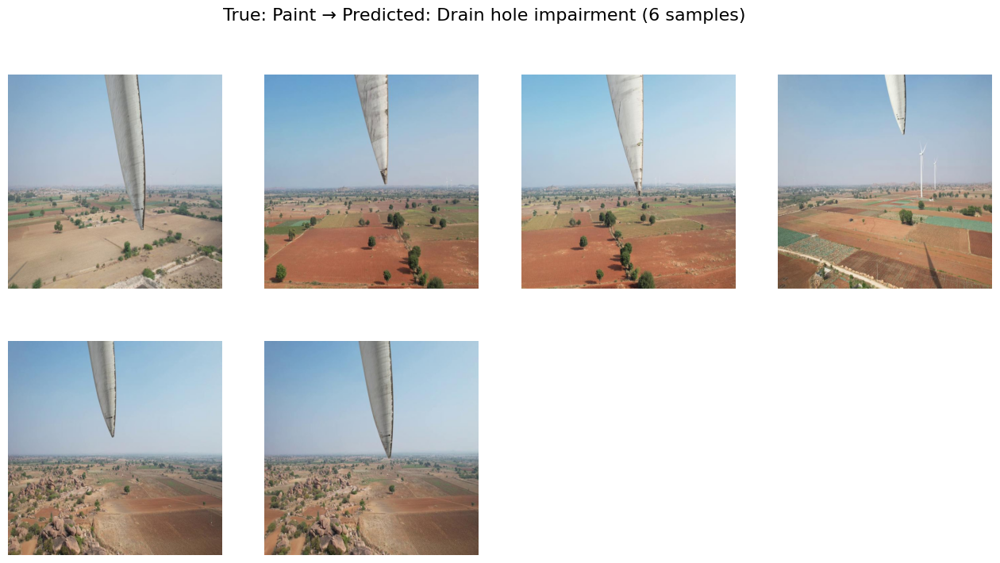

In [ ]:
show_confusion(class_names.index("Paint"), class_names.index("Drain hole impairment"))

In [ ]:
show_confusion(class_names.index("dirt"), class_names.index("Drain hole impairment"))

No confusion images for True='dirt' → Pred='Drain hole impairment'


In [ ]:
import matplotlib.pyplot as plt
from PIL import Image
import os, glob

def show_true_images(label_name, subset="train_small"):
    true_idx = class_names.index(label_name)

    label_dir = f"/content/wind-combined-2/{subset}/labels"
    img_dir   = f"/content/wind-combined-2/{subset}/images"

    imgs = []

    for lf in glob.glob(label_dir + "/*.txt"):
        with open(lf) as f:
            line = f.readline().strip().split()
            if not line:
                continue
            if int(line[0]) == true_idx:
                base = os.path.splitext(os.path.basename(lf))[0]
                img_path = os.path.join(img_dir, base + ".jpg")
                if os.path.exists(img_path):
                    imgs.append(img_path)

    print(f"Found {len(imgs)} images for '{label_name}' in {subset}/images")

    if not imgs:
        return

    cols = 3
    rows = (len(imgs) + cols - 1) // cols

    plt.figure(figsize=(16, rows * 5))
    for i, img_path in enumerate(imgs):
        img = Image.open(img_path)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(os.path.basename(img_path))
        plt.axis("off")
    plt.show()


Found 40 images for 'Drain hole impairment' in train_small/images


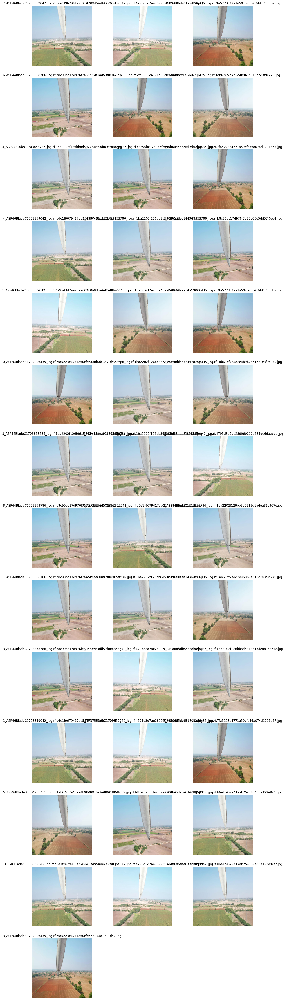

In [ ]:
show_true_images("Drain hole impairment", subset="train_small")


In [ ]:
import glob, os
from collections import defaultdict

# class list from your dataset
class_names = [
    'Drain hole impairment', 'Lightning Strike', 'OIL LEAKAGE', 'PU-tape',
    'Paint', 'Surface Crack', 'dirt', 'le-erosion'
]

def find_multilabel_images(root="/content/wind-combined-2/train_small"):
    label_dir = os.path.join(root, "labels")
    img_dir   = os.path.join(root, "images")

    multi = {}  # filename -> list of class names

    for lf in glob.glob(label_dir + "/*.txt"):
        with open(lf, "r") as f:
            lines = [ln.strip().split() for ln in f.readlines() if ln.strip()]

        if len(lines) > 1:
            # more than one object present → multi-label
            classes = sorted(list(set(int(ln[0]) for ln in lines)))
            class_names_list = [class_names[c] for c in classes]

            base = os.path.splitext(os.path.basename(lf))[0]
            img_path = os.path.join(img_dir, base + ".jpg")

            multi[img_path] = class_names_list

    return multi

multi_images = find_multilabel_images()
print(f"Found {len(multi_images)} multi-label images.\n")

for img, cls_list in multi_images.items():
    print(os.path.basename(img), "→", cls_list)


Found 15 multi-label images.

4_ASP26BladeC1704299809_jpg.rf.d927b0cf48c61b3316033882bc6ded6e.jpg → ['Paint', 'Surface Crack']
ASP17BladeA1704383188_jpg.rf.329877c2fde3232fe657519f3d055d0d.jpg → ['Paint', 'dirt']
WTG-31_19_jpg.rf.f0baafe664a89e933151c98ab0c7c5e2.jpg → ['dirt']
WTG-5_11_jpg.rf.4818fa4daf106cb0b7726daddec87a02.jpg → ['dirt']
WTG-60_13_jpg.rf.ad354d18ec533d50b9d10289e5077090.jpg → ['dirt']
ASP26BladeC1704299809_jpg.rf.d927b0cf48c61b3316033882bc6ded6e.jpg → ['Paint', 'Surface Crack']
ASP55BladeC1703858344_jpg.rf.a52f13a4ee64ca804ee68ac415723b71.jpg → ['OIL LEAKAGE', 'dirt']
WTG-4_40_jpg.rf.cd7c17fb90c58d9ef3f0fa0049c1d916.jpg → ['dirt']
BEN-4_27_jpg.rf.72d4adad8de3fdfce33da0b5191a87c3.jpg → ['OIL LEAKAGE']
ASP17BladeA1704383188_jpg.rf.e6b2847ffc8bce6d852403678a0c9ca7.jpg → ['Paint', 'dirt']
ASP84BladeB1703686574_jpg.rf.8afe8fcac8bcb6f5c7d68dfef3a85bcc.jpg → ['OIL LEAKAGE', 'Paint']
GA740_37_jpg.rf.feb09d88de7949c6b1bc89aaa0fa00b3.jpg → ['Paint']
ASP18BladeA1704104091_jpg.r

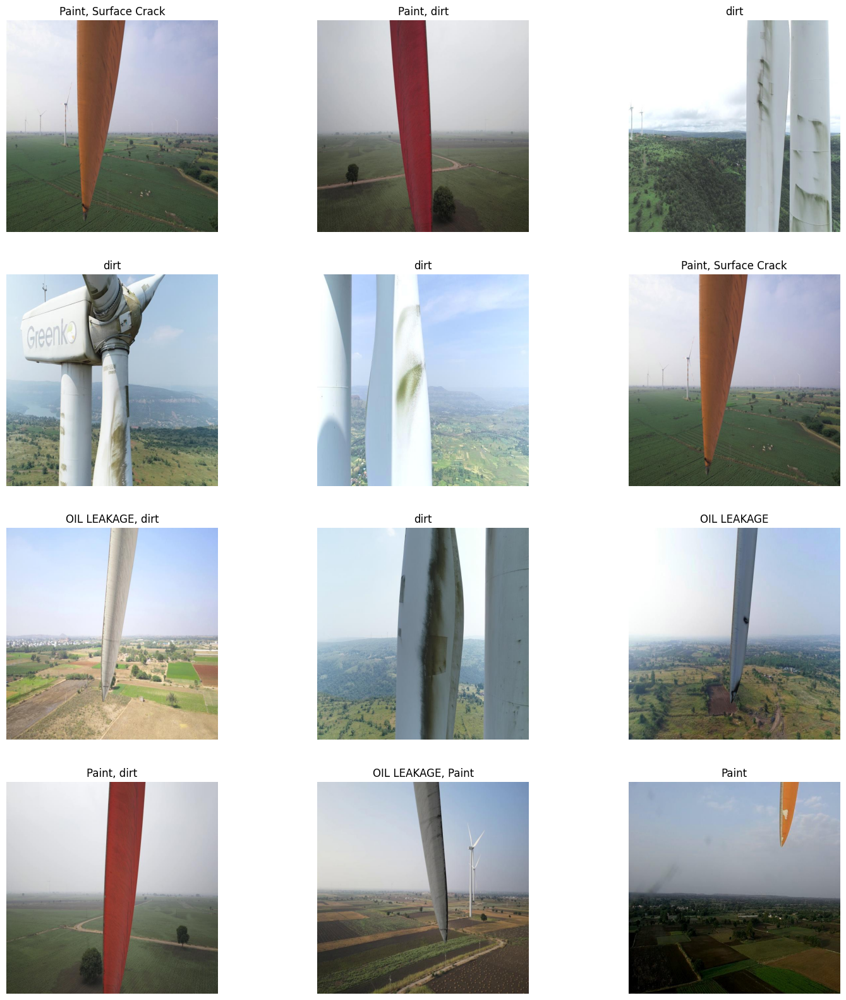

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

def show_multilabel_images(multi_dict, max_images=12):
    imgs = list(multi_dict.items())[:max_images]

    cols = 3
    rows = (len(imgs) + cols - 1) // cols

    plt.figure(figsize=(18, rows * 5))

    for i, (img_path, labels) in enumerate(imgs):
        img = Image.open(img_path)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.title(", ".join(labels))
        plt.axis("off")

    plt.show()

show_multilabel_images(multi_images)


# Riya's Code


In [ ]:
# Setup
root = Path(dataset.location)

train_img_dir = root / "train/images"
train_lbl_dir = root / "train/labels"

valid_img_dir = root / "valid/images"
valid_lbl_dir = root / "valid/labels"

# New filtered/balanced folders (NO Paint, NO dirt)
subset_img = root / "train_small_nopaintdirt/images"
subset_lbl = root / "train_small_nopaintdirt/labels"
valid_img_out = root / "valid_nopaintdirt/images"
valid_lbl_out = root / "valid_nopaintdirt/labels"

subset_img.mkdir(parents=True, exist_ok=True)
subset_lbl.mkdir(parents=True, exist_ok=True)
valid_img_out.mkdir(parents=True, exist_ok=True)
valid_lbl_out.mkdir(parents=True, exist_ok=True)

# Define class mapping
with open(root / "data.yaml") as f:
    orig_yaml = yaml.safe_load(f)

orig_names = orig_yaml["names"]  # og 8 classes
print("Original classes:", orig_names)

# Drop paint and dirt because deemed less important
drop_names = {"Paint", "dirt"}

# Classes to KEEP in new 6-class problem = Drain hole impairment, Lightning Strike, OIL LEAKAGE, PU-tape, Surface Crack, le-erosion
keep_names = [name for name in orig_names if name not in drop_names]
print("Keeping classes:", keep_names)

# Build mapping old_id -> new_id for kept classes
orig_id_to_new_id = {}
for new_id, name in enumerate(keep_names):
    old_id = orig_names.index(name)
    orig_id_to_new_id[old_id] = new_id

keep_ids = set(orig_id_to_new_id.keys())
print("Old ID -> New ID mapping:", orig_id_to_new_id)

# Helper: filter a label file's lines by class and remap IDs
def filter_and_remap_label(lbl_path, keep_ids, id_map):
    """Return (filtered_lines, old_ids_kept) after dropping Paint/dirt and remapping IDs."""
    with open(lbl_path) as f:
        lines = f.readlines()

    filtered_lines = []
    new_ids_in_file = set()

    for line in lines:
        parts = line.strip().split()
        if not parts:
            continue
        old_cid = int(parts[0])
        if old_cid in keep_ids:
            new_cid = id_map[old_cid]
            parts[0] = str(new_cid)
            filtered_lines.append(" ".join(parts) + "\n")
            new_ids_in_file.add(new_cid)

    return filtered_lines, new_ids_in_file

Original classes: ['Drain hole impairment', 'Lightning Strike', 'OIL LEAKAGE', 'PU-tape', 'Paint', 'Surface Crack', 'dirt', 'le-erosion']
Keeping classes: ['Drain hole impairment', 'Lightning Strike', 'OIL LEAKAGE', 'PU-tape', 'Surface Crack', 'le-erosion']
Old ID -> New ID mapping: {0: 0, 1: 1, 2: 2, 3: 3, 5: 4, 7: 5}


In [ ]:
# Training: build a balanced subset WITHOUT Paint/dirt
random.seed(42)

# First, gather filtered info for all train label files
info_by_name = {}          # lbl filename -> dict(img_path, lines, class_ids)
images_by_class = defaultdict(list)  # new_cid -> list of (img_path, lbl_name)

for lbl_path in train_lbl_dir.glob("*.txt"):
    filtered_lines, new_ids = filter_and_remap_label(lbl_path, keep_ids, orig_id_to_new_id)

    # Skip images that only had Paint/dirt (no remaining classes)
    if not filtered_lines:
        continue

    # find corresponding image
    img_jpg = train_img_dir / (lbl_path.stem + ".jpg")
    img_png = train_img_dir / (lbl_path.stem + ".png")
    if img_jpg.exists():
        img_path = img_jpg
    elif img_png.exists():
        img_path = img_png
    else:
        # skipp if no image found
        continue

    lbl_name = lbl_path.name
    info_by_name[lbl_name] = {
        "img_path": img_path,
        "lines": filtered_lines,
        "class_ids": new_ids
    }

    # populate per-class image list (using NEW class IDs)
    for cid in new_ids:
        images_by_class[cid].append((img_path, lbl_name))

# Choose equal number of images per class (balanced subset)
target_per_class = 40   # may have to adjust later - this is just picked bc ayela used 40, once we get details on proportions, can chnage
subset_pairs = set()

for cid in range(len(keep_names)):  # ensure we iterate over all 6 classes
    pairs = images_by_class.get(cid, [])
    random.shuffle(pairs)
    take = min(target_per_class, len(pairs))
    subset_pairs.update(pairs[:take])
    print(f"Class {cid} ({keep_names[cid]}): taking {take} images")

# Copy selected images + write filtered labels
for img_path, lbl_name in subset_pairs:
    shutil.copy(img_path, subset_img / img_path.name)
    with open(subset_lbl / lbl_name, "w") as f:
        f.writelines(info_by_name[lbl_name]["lines"])

print(f"\nBalanced subset WITHOUT Paint/dirt created with {len(subset_pairs)} images.")
print("Subset images dir:", subset_img)
print("Subset labels dir:", subset_lbl)

# 4. VALIDATION: filter val set WITHOUT Paint/dirt (no balancing)
copied_val = 0

for lbl_path in valid_lbl_dir.glob("*.txt"):
    filtered_lines, new_ids = filter_and_remap_label(lbl_path, keep_ids, orig_id_to_new_id)

    # Keep only images that contain at least one of the kept classes
    if not filtered_lines:
        continue

    img_jpg = valid_img_dir / (lbl_path.stem + ".jpg")
    img_png = valid_img_dir / (lbl_path.stem + ".png")
    if img_jpg.exists():
        img_path = img_jpg
    elif img_png.exists():
        img_path = img_png
    else:
        continue

    shutil.copy(img_path, valid_img_out / img_path.name)
    with open(valid_lbl_out / lbl_path.name, "w") as f:
        f.writelines(filtered_lines)

    copied_val += 1

print(f"\nValidation set WITHOUT Paint/dirt created with {copied_val} images.")
print("Val images dir:", valid_img_out)
print("Val labels dir:", valid_lbl_out)

# New YAML for 6-class problem
yaml_nopaintdirt = root / "data_nopaintdirt.yaml"
new_yaml = orig_yaml.copy()

# Point to new train/val folders
new_yaml["train"] = "train_small_nopaintdirt/images"
new_yaml["val"]   = "valid_nopaintdirt/images"
new_yaml["names"] = keep_names
new_yaml["nc"]    = len(keep_names)

with open(yaml_nopaintdirt, "w") as f:
    yaml.dump(new_yaml, f)

print("\nNew YAML without Paint/dirt saved at:", yaml_nopaintdirt)
print("New class list:", new_yaml["names"])

In [ ]:
from ultralytics import YOLO

# First 6-class training run (no Paint, no dirt)

print("Using data YAML:", yaml_nopaintdirt)

model_first = YOLO("yolov8n.pt")

results_first = model_first.train(
    data=str(yaml_nopaintdirt),  # 6-class config
    imgsz=512,
    epochs=20,
    batch=8,
    device=0,
    cache=True,
    cos_lr=True,
    patience=5,
    seed=42
)

print("\n[Block 1] First run save dir:", results_first.save_dir)

In [ ]:
# Fine-tuned 6-class model starting from first run final weights

from ultralytics import YOLO

last_first_path = results_first.save_dir / "weights" / "last.pt"
print("Loading first-run last.pt from:", last_first_path)

model_ft = YOLO(str(last_first_path))

# Fine-tune at higher resolution,
results_ft = model_ft.train(
    data=str(yaml_nopaintdirt),
    epochs=20,                    # extra epochs
    imgsz=640,                    # higher res
    batch=8,
    device=0,
    resume=False,
    cos_lr=True,
    seed=42,
    save=True,
    project="/content/runs/detect",
    name="train_finetune_nopaintdirt"
)

print("\n[Block 2] Fine-tune run save dir:", results_ft.save_dir)

In [ ]:
# Compare first vs fine-tuned, choose best, predict + confusion matrix

# Load best weights from both runs
first_best_path = results_first.save_dir / "weights" / "best.pt"
ft_best_path    = results_ft.save_dir    / "weights" / "best.pt"

print("First run best.pt:", first_best_path)
print("Fine-tuned run best.pt:", ft_best_path)

model_first_best = YOLO(str(first_best_path))
metrics_first_best = model_first_best.val(data=str(yaml_nopaintdirt))
print("\n=== First run (best.pt) metrics ===")
print("mAP50-95:", metrics_first_best.box.map)
print("Precision:", metrics_first_best.box.p)
print("Recall:",    metrics_first_best.box.r)

model_ft_best = YOLO(str(ft_best_path))
metrics_ft_best = model_ft_best.val(data=str(yaml_nopaintdirt))
print("\n=== Fine-tuned run (best.pt) metrics ===")
print("mAP50-95:", metrics_ft_best.box.map)
print("Precision:", metrics_ft_best.box.p)
print("Recall:",    metrics_ft_best.box.r)

# Choose better model
if metrics_ft_best.box.map > metrics_first_best.box.map:
    print("\n=> Using FINE-TUNED model for predictions.")
    best_model = model_ft_best
    best_tag = "ft"
else:
    print("\n=> Using FIRST model for predictions.")
    best_model = model_first_best
    best_tag = "first"

# Predict on filtered validation images (6-class, no Paint/dirt)
print("Predicting on validation images in:", valid_img_out)

results_pred_best = best_model.predict(
    source=str(valid_img_out),
    conf=0.1,                          # lower conf to catch weak detections
    save=True,                         # save annotated images
    save_txt=True,                     # save YOLO-format predictions
    save_conf=True,
    name=f"predict_best_nopaintdirt_{best_tag}"
)

# Get the prediction directory from the results object
pred_dir = results_pred_best[0].save_dir
print("\nPredictions saved in:", pred_dir)

# Show a few annotated images
for img_path in glob.glob(os.path.join(pred_dir, "*.jpg"))[:5]:
    display(Image(filename=img_path, width=500))

# Confusion matrix
pred_label_dir = os.path.join(pred_dir, "labels")
true_label_dir = str(valid_lbl_out)

class_names_6 = [
    "Drain hole impairment",
    "Lightning Strike",
    "OIL LEAKAGE",
    "PU-tape",
    "Surface Crack",
    "le-erosion"
]

n_classes = len(class_names_6)
conf_matrix = np.zeros((n_classes, n_classes), dtype=int)

for pred_file in glob.glob(os.path.join(pred_label_dir, "*.txt")):
    fname = os.path.basename(pred_file)
    true_file = os.path.join(true_label_dir, fname)
    if not os.path.exists(true_file):
        continue

    with open(pred_file) as pf, open(true_file) as tf:
        preds = [int(line.split()[0]) for line in pf if line.strip()]
        trues = [int(line.split()[0]) for line in tf if line.strip()]

    true_counts = Counter(trues)
    pred_counts = Counter(preds)

    for t_class, t_count in true_counts.items():
        for p_class, p_count in pred_counts.items():
            conf_matrix[t_class, p_class] += min(t_count, p_count)

df_conf_best = pd.DataFrame(conf_matrix, index=class_names_6, columns=class_names_6)
df_conf_best.index.name = "True / Predicted"

print("\nConfusion matrix for chosen best model:")
print(df_conf_best)


**At this point we've done the following:**
- Limited ourselves to 6 classes and created a balanced train subset and validation set only on these classes:
["Drain hole impairment", "Lightning Strike", "OIL LEAKAGE", "PU-tape", "Surface Crack", "le-erosion"]
- We have a new YAML: data_nopaintdirt.yaml that describes this 6-class dataset
- A 6-class model focused entirely on the “real” damage types we care about

**Best model (fine tuned) specifics:**
- Never predicts drain hole now as removed (consistent with the idea that one class has recall = 0)
- le-erosion is the “garbage can” class (consistent with the fact that we have so many of these images)
  - Lightning Strike → 1 predicted as le-erosion
  - OIL LEAKAGE → 0 as le-erosion
  - PU-tape → 0 as le-erosion
  - Surface Crack → 1 as le-erosion
  - le-erosion → 265 as le-erosion (good bc these are TPs)
  - From the le-erosion row → 17 as PU-tape, 16 as Surface Crack, 2 as OIL, 1 as Lightning
- OIL LEAKAGE is actually doing pretty well (there's some confusion with PU tape but upon inspection of the images, I can see where the confusion could occur)
  - 30 → OIL LEAKAGE (correct)
  - 7 → PU-tape
  - 1 → Lightning
  - 1 → Surface Crack
- Lightning Strike row shows 7 correct, plus 1 misclassified as Surface Crack, 1 as le-erosion (good that the misclassifications are also within the highest importance category though so there's still a priority list for adressing concerns?)
- Surface Crack row often being mistaken for other linear-ish/tiny patterns

Lets try alternate weighting methods?


In [ ]:
# Setup
root = Path(dataset.location)

train_img_dir = root / "train/images"
train_lbl_dir = root / "train/labels"

valid_img_dir = root / "valid/images"
valid_lbl_dir = root / "valid/labels"

# New filtered/balanced folders (NO Paint, NO dirt)
subset_img = root / "train_small_nopaintdirt/images"
subset_lbl = root / "train_small_nopaintdirt/labels"
valid_img_out = root / "valid_nopaintdirt/images"
valid_lbl_out = root / "valid_nopaintdirt/labels"

subset_img.mkdir(parents=True, exist_ok=True)
subset_lbl.mkdir(parents=True, exist_ok=True)
valid_img_out.mkdir(parents=True, exist_ok=True)
valid_lbl_out.mkdir(parents=True, exist_ok=True)

# Define class mapping
with open(root / "data.yaml") as f:
    orig_yaml = yaml.safe_load(f)

orig_names = orig_yaml["names"]  # og 8 classes
print("Original classes:", orig_names)

# Drop paint and dirt because deemed less important
drop_names = {"Paint", "dirt"}

# Classes to KEEP in new 6-class problem = Drain hole impairment, Lightning Strike, OIL LEAKAGE, PU-tape, Surface Crack, le-erosion
keep_names = [name for name in orig_names if name not in drop_names]
print("Keeping classes:", keep_names)

# Build mapping old_id -> new_id for kept classes
orig_id_to_new_id = {}
for new_id, name in enumerate(keep_names):
    old_id = orig_names.index(name)
    orig_id_to_new_id[old_id] = new_id

keep_ids = set(orig_id_to_new_id.keys())
print("Old ID -> New ID mapping:", orig_id_to_new_id)

# Helper: filter a label file's lines by class and remap IDs
def filter_and_remap_label(lbl_path, keep_ids, id_map):
    """Return (filtered_lines, old_ids_kept) after dropping Paint/dirt and remapping IDs."""
    with open(lbl_path) as f:
        lines = f.readlines()

    filtered_lines = []
    new_ids_in_file = set()

    for line in lines:
        parts = line.strip().split()
        if not parts:
            continue
        old_cid = int(parts[0])
        if old_cid in keep_ids:
            new_cid = id_map[old_cid]
            parts[0] = str(new_cid)
            filtered_lines.append(" ".join(parts) + "\n")
            new_ids_in_file.add(new_cid)

    return filtered_lines, new_ids_in_file

Original classes: ['Drain hole impairment', 'Lightning Strike', 'OIL LEAKAGE', 'PU-tape', 'Paint', 'Surface Crack', 'dirt', 'le-erosion']
Keeping classes: ['Drain hole impairment', 'Lightning Strike', 'OIL LEAKAGE', 'PU-tape', 'Surface Crack', 'le-erosion']
Old ID -> New ID mapping: {0: 0, 1: 1, 2: 2, 3: 3, 5: 4, 7: 5}


In [ ]:
# Training: build a weighted subset WITHOUT Paint/dirt
random.seed(42)

# First, gather filtered info for all train label files
info_by_name = {}          # lbl filename -> dict(img_path, lines, class_ids)
images_by_class = defaultdict(list)  # new_cid -> list of (img_path, lbl_name)

for lbl_path in train_lbl_dir.glob("*.txt"):
    filtered_lines, new_ids = filter_and_remap_label(lbl_path, keep_ids, orig_id_to_new_id)

    # Skip images that only had Paint/dirt (no remaining classes)
    if not filtered_lines:
        continue

    # find corresponding image
    img_jpg = train_img_dir / (lbl_path.stem + ".jpg")
    img_png = train_img_dir / (lbl_path.stem + ".png")
    if img_jpg.exists():
        img_path = img_jpg
    elif img_png.exists():
        img_path = img_png
    else:
        # skip if no image found
        continue

    lbl_name = lbl_path.name
    info_by_name[lbl_name] = {
        "img_path": img_path,
        "lines": filtered_lines,
        "class_ids": new_ids
    }

    # populate per-class image list (using NEW class IDs)
    for cid in new_ids:
        images_by_class[cid].append((img_path, lbl_name))

# Inspect TRAIN images per class (after removing Paint & dirt)
print("\n=== TRAIN images per class (filtered, 6 classes) ===")
for cid, name in enumerate(keep_names):
    n_imgs = len(images_by_class.get(cid, []))
    print(f"Class {cid} ({name}): {n_imgs} images")

# Inspect VAL images per class (after removing Paint & dirt)
from collections import Counter
val_counts = Counter()

for lbl_path in valid_lbl_dir.glob("*.txt"):
    filtered_lines, new_ids = filter_and_remap_label(lbl_path, keep_ids, orig_id_to_new_id)
    if not filtered_lines:
        continue
    # new_ids is a set of NEW class IDs present in this val image
    val_counts.update(new_ids)

print("\n=== VAL images per class (filtered, 6 classes) ===")
for cid, name in enumerate(keep_names):
    print(f"Class {cid} ({name}): {val_counts[cid]} images")

# Build weighted subset: prioritize Surface Crack, LE-erosion, Lightning
base_target = 40  # default target per class

per_class_target = {}
for cid, name in enumerate(keep_names):
    if name in {"Lightning Strike", "Surface Crack"}:
        per_class_target[cid] = 60   # more examples for key rare/critical classes
    elif name == "le-erosion":
        per_class_target[cid] = 50   # already abundant; still give a bit more
    else:
        # Drain hole impairment, OIL LEAKAGE, PU-tape
        per_class_target[cid] = base_target

print("\n=== Desired target_per_class ===")
for cid, name in enumerate(keep_names):
    print(f"Class {cid} ({name}): target {per_class_target[cid]} images")

subset_pairs = set()

for cid, name in enumerate(keep_names):
    pairs = images_by_class.get(cid, [])
    random.shuffle(pairs)

    target = per_class_target[cid]
    take = min(target, len(pairs))   # cannot exceed available images

    if len(pairs) < target:
        print(
            f"WARNING: class {cid} ({name}) only has {len(pairs)} train images, "
            f"less than desired target {target} (no oversampling without duplication)."
        )

    subset_pairs.update(pairs[:take])
    print(f"Class {cid} ({name}): taking {take} images into train_small_nopaintdirt")

# Copy selected images + write filtered labels
for img_path, lbl_name in subset_pairs:
    shutil.copy(img_path, subset_img / img_path.name)
    with open(subset_lbl / lbl_name, "w") as f:
        f.writelines(info_by_name[lbl_name]["lines"])

print(f"\nWeighted subset WITHOUT Paint/dirt created with {len(subset_pairs)} images.")
print("Subset images dir:", subset_img)
print("Subset labels dir:", subset_lbl)

# VALIDATION: filter val set WITHOUT Paint/dirt (no balancing)
copied_val = 0

for lbl_path in valid_lbl_dir.glob("*.txt"):
    filtered_lines, new_ids = filter_and_remap_label(lbl_path, keep_ids, orig_id_to_new_id)

    # Keep only images that contain at least one of the kept classes
    if not filtered_lines:
        continue

    img_jpg = valid_img_dir / (lbl_path.stem + ".jpg")
    img_png = valid_img_dir / (lbl_path.stem + ".png")
    if img_jpg.exists():
        img_path = img_jpg
    elif img_png.exists():
        img_path = img_png
    else:
        continue

    shutil.copy(img_path, valid_img_out / img_path.name)
    with open(valid_lbl_out / lbl_path.name, "w") as f:
        f.writelines(filtered_lines)

    copied_val += 1

print(f"\nValidation set WITHOUT Paint/dirt created with {copied_val} images.")
print("Val images dir:", valid_img_out)
print("Val labels dir:", valid_lbl_out)

# New YAML for 6-class problem
yaml_nopaintdirt = root / "data_nopaintdirt.yaml"
new_yaml = orig_yaml.copy()

# Point to new train/val folders
new_yaml["train"] = "train_small_nopaintdirt/images"
new_yaml["val"]   = "valid_nopaintdirt/images"
new_yaml["names"] = keep_names
new_yaml["nc"]    = len(keep_names)

with open(yaml_nopaintdirt, "w") as f:
    yaml.dump(new_yaml, f)

print("\nNew YAML without Paint/dirt saved at:", yaml_nopaintdirt)
print("New class list:", new_yaml["names"])



=== TRAIN images per class (filtered, 6 classes) ===
Class 0 (Drain hole impairment): 6 images
Class 1 (Lightning Strike): 231 images
Class 2 (OIL LEAKAGE): 528 images
Class 3 (PU-tape): 280 images
Class 4 (Surface Crack): 398 images
Class 5 (le-erosion): 1902 images

=== VAL images per class (filtered, 6 classes) ===
Class 0 (Drain hole impairment): 0 images
Class 1 (Lightning Strike): 154 images
Class 2 (OIL LEAKAGE): 120 images
Class 3 (PU-tape): 2 images
Class 4 (Surface Crack): 122 images
Class 5 (le-erosion): 280 images

=== Desired target_per_class ===
Class 0 (Drain hole impairment): target 40 images
Class 1 (Lightning Strike): target 60 images
Class 2 (OIL LEAKAGE): target 40 images
Class 3 (PU-tape): target 40 images
Class 4 (Surface Crack): target 60 images
Class 5 (le-erosion): target 50 images
Class 0 (Drain hole impairment): taking 6 images into train_small_nopaintdirt
Class 1 (Lightning Strike): taking 60 images into train_small_nopaintdirt
Class 2 (OIL LEAKAGE): taking

In [ ]:
from ultralytics import YOLO

# Base 6-class training run (no Paint, no dirt)

print("Using data YAML:", yaml_nopaintdirt)

# Base model on 6-class dataset
yolo6_base_model = YOLO("yolov8n.pt")

yolo6_base_results = yolo6_base_model.train(
    data=str(yaml_nopaintdirt),  # 6-class config
    imgsz=512,
    epochs=20,
    batch=8,
    device=0,
    cache=True,
    cos_lr=True,
    patience=5,
    seed=42
)

print("\n[Block 1] Base run save dir:", yolo6_base_results.save_dir)


In [ ]:
from ultralytics import YOLO

# Fine-tuned 6-class model starting from base run

ckpt_base6_last = yolo6_base_results.save_dir / "weights" / "last.pt"
print("Loading base run last.pt from:", ckpt_base6_last)

yolo6_tuned_model = YOLO(str(ckpt_base6_last))

# Fine-tune at higher resolution
yolo6_tuned_results = yolo6_tuned_model.train(
    data=str(yaml_nopaintdirt),
    epochs=20,                    # extra epochs
    imgsz=640,                    # higher res
    batch=8,
    device=0,
    resume=False,
    cos_lr=True,
    seed=42,
    save=True,
    project="/content/runs/detect",
    name="train_finetune_nopaintdirt"
)

print("\n[Block 2] Fine-tune run save dir:", yolo6_tuned_results.save_dir)


In [ ]:
# Compare base vs tuned, choose best, predict + confusion matrix

from ultralytics import YOLO
import os, glob
import numpy as np
import pandas as pd
from collections import Counter
from IPython.display import Image, display

# Load best weights from both runs
ckpt_base6_best  = yolo6_base_results.save_dir  / "weights" / "best.pt"
ckpt_tuned6_best = yolo6_tuned_results.save_dir / "weights" / "best.pt"

print("Base run best.pt:", ckpt_base6_best)
print("Tuned run best.pt:", ckpt_tuned6_best)

yolo6_base_best_model  = YOLO(str(ckpt_base6_best))
metrics_base6_best = yolo6_base_best_model.val(data=str(yaml_nopaintdirt))
print("\n=== Base run (best.pt) metrics ===")
print("mAP50-95:", metrics_base6_best.box.map)
print("Precision:", metrics_base6_best.box.p)
print("Recall:",    metrics_base6_best.box.r)

yolo6_tuned_best_model = YOLO(str(ckpt_tuned6_best))
metrics_tuned6_best = yolo6_tuned_best_model.val(data=str(yaml_nopaintdirt))
print("\n=== Tuned run (best.pt) metrics ===")
print("mAP50-95:", metrics_tuned6_best.box.map)
print("Precision:", metrics_tuned6_best.box.p)
print("Recall:",    metrics_tuned6_best.box.r)

# Choose better model (currently by mAP50-95)
if metrics_tuned6_best.box.map > metrics_base6_best.box.map:
    print("\n=> Using TUNED model for predictions.")
    best_yolo6_model = yolo6_tuned_best_model
    best_run_label = "tuned"
else:
    print("\n=> Using BASE model for predictions.")
    best_yolo6_model = yolo6_base_best_model
    best_run_label = "base"

# Predict on filtered validation images (6-class, no Paint/dirt)
print("Predicting on validation images in:", valid_img_out)

yolo6_pred_results = best_yolo6_model.predict(
    source=str(valid_img_out),
    conf=0.1,                          # lower conf to catch weak detections
    save=True,                         # save annotated images
    save_txt=True,                     # save YOLO-format predictions
    save_conf=True,
    name=f"predict_best_nopaintdirt_{best_run_label}"
)

# Get the prediction directory from the results object
pred_dir = yolo6_pred_results[0].save_dir
print("\nPredictions saved in:", pred_dir)

# Show a few annotated images
for img_path in glob.glob(os.path.join(pred_dir, "*.jpg"))[:5]:
    display(Image(filename=img_path, width=500))

# Confusion matrix
pred_label_dir = os.path.join(pred_dir, "labels")
true_label_dir = str(valid_lbl_out)

class_names_6 = [
    "Drain hole impairment",
    "Lightning Strike",
    "OIL LEAKAGE",
    "PU-tape",
    "Surface Crack",
    "le-erosion"
]

n_classes = len(class_names_6)
conf_matrix = np.zeros((n_classes, n_classes), dtype=int)

for pred_file in glob.glob(os.path.join(pred_label_dir, "*.txt")):
    fname = os.path.basename(pred_file)
    true_file = os.path.join(true_label_dir, fname)
    if not os.path.exists(true_file):
        continue

    with open(pred_file) as pf, open(true_file) as tf:
        preds = [int(line.split()[0]) for line in pf if line.strip()]
        trues = [int(line.split()[0]) for line in tf if line.strip()]

    true_counts = Counter(trues)
    pred_counts = Counter(preds)

    for t_class, t_count in true_counts.items():
        for p_class, p_count in pred_counts.items():
            conf_matrix[t_class, p_class] += min(t_count, p_count)

df_conf_best = pd.DataFrame(conf_matrix, index=class_names_6, columns=class_names_6)
df_conf_best.index.name = "True / Predicted"

print("\nConfusion matrix for chosen best model:")
print(df_conf_best)


NameError: name 'yolo6_base_results' is not defined

This model with the chnaged sampling technique performs better than the previous one:
- Approx per-class recall (using row sums):
  - Lightning Strike: row = [0, 6, 0, 0, 2, 0] → 6 / (6+2) = 0.75
  - Surface Crack: row = [0, 3, 0, 0, 9, 2] → 9 / 14 ≈ 0.64
  - le-erosion: row = [0, 1, 1, 10, 9, 263] → 263 / 284 ≈ 0.93
- le-erosion is really strong, lightning has ok recall but some confusion with Surface Crack, and Surface Crack is also decent but still confusable with le-erosion and Lightning
  - I don't think this model is the worst case considering even where the confusion occurs, it is still being confused with something else in the most important class group st we'd still address it with the same level of priority/intensity??

In [ ]:
from roboflow import Roboflow

rf = Roboflow(api_key="2seZOcizRn4vVMVEAlwn")

# Old dataset (already working)
project_main = rf.workspace("gayathry").project("wind-combined")
print("Main project:", project_main.name)

# New dataset
project_extra = rf.workspace("windturbine-qopdj").project("wind-turbine-detect")
print("Extra project:", project_extra.name)


# Riya Code for New Updated Dataset from 11/18

In [ ]:
rf = Roboflow(api_key="2seZOcizRn4vVMVEAlwn")

project_main = rf.workspace("gayathry").project("wind-combined")
version_main = project_main.version(2)
dataset_main = version_main.download("yolov8")
root_main = Path(dataset_main.location)

project_extra = rf.workspace("windturbine-qopdj").project("wind-turbine-detect")
version_extra = project_extra.version(1)      # adjust if your extra project uses another version
dataset_extra = version_extra.download("yolov8")
root_extra = Path(dataset_extra.location)

loading Roboflow workspace...
loading Roboflow project...
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to wind-turbine-detect-1 in yolov8:: 100%|██████████| 6661/6661 [00:00<00:00, 8574.70it/s]


In [ ]:
# Read old (main) dataset YAML
with open(root_main / "data.yaml") as f:
    main_yaml = yaml.safe_load(f)
main_names = main_yaml["names"]
print("Main dataset classes:", main_names)

# Read extra dataset YAML
with open(root_extra / "data.yaml") as f:
    extra_yaml = yaml.safe_load(f)
extra_names = extra_yaml["names"]
print("Extra dataset classes:", extra_names)

# Helper: map extra class name -> canonical old class name (or None to drop)
def map_extra_name_to_main_name(name: str):
    n = name.strip().lower()
    if n in {"crack", "surface crack"}:
        return "Surface Crack"
    if n == "oil":
        return "OIL LEAKAGE"
    if n == "thunderstrike":
        return "Lightning Strike"
    # deformation, dirt, rust, etc. => ignored
    return None

Main dataset classes: ['Drain hole impairment', 'Lightning Strike', 'OIL LEAKAGE', 'PU-tape', 'Paint', 'Surface Crack', 'dirt', 'le-erosion']
Extra dataset classes: ['crack', 'deformation', 'dirt', 'oil', 'peeling', 'rust', 'thunderstrike']


In [ ]:
from pathlib import Path

def ensure_dir(path: Path):
    path.mkdir(parents=True, exist_ok=True)

# Make sure main dataset has the expected train/valid dirs
for split in ["train", "valid"]:
    ensure_dir(root_main / split / "images")
    ensure_dir(root_main / split / "labels")

# Function to process one split (train or valid) from extra → main
def merge_split_from_extra_to_main(split: str):
    extra_img_dir = root_extra / split / "images"
    extra_lbl_dir = root_extra / split / "labels"

    main_img_dir  = root_main / split / "images"
    main_lbl_dir  = root_main / split / "labels"

    if not extra_lbl_dir.exists():
        print(f"Split '{split}' not found in extra dataset, skipping.")
        return

    kept_files = 0
    skipped_files = 0

    for lbl_path in extra_lbl_dir.glob("*.txt"):
        with open(lbl_path) as f:
            lines = f.readlines()

        filtered_lines = []

        for line in lines:
            parts = line.strip().split()
            if not parts:
                continue
            old_cid = int(parts[0])
            if old_cid < 0 or old_cid >= len(extra_names):
                continue

            extra_name = extra_names[old_cid]
            mapped_main_name = map_extra_name_to_main_name(extra_name)

            # Skip labels we don't care about (deformation, dirt, rust, etc.)
            if mapped_main_name is None:
                continue

            # Find corresponding class index in the main dataset's names
            try:
                new_cid = main_names.index(mapped_main_name)
            except ValueError:
                # If the mapped class name isn't present in main_names, skip
                continue

            parts[0] = str(new_cid)  # overwrite class id
            filtered_lines.append(" ".join(parts) + "\n")

        # If no usable labels remain, skip this image entirely
        if not filtered_lines:
            skipped_files += 1
            continue

        # Find corresponding image in extra split
        stem = lbl_path.stem
        img_path = None
        for ext in [".jpg", ".jpeg", ".png"]:
            candidate = extra_img_dir / f"{stem}{ext}"
            if candidate.exists():
                img_path = candidate
                break

        if img_path is None:
            # No matching image file, skip
            skipped_files += 1
            continue

        # Copy image & remapped label into main dataset split
        dest_img = main_img_dir / img_path.name
        dest_lbl = main_lbl_dir / lbl_path.name

        # NOTE: if filenames overlap between datasets, this will overwrite.
        # If you suspect collisions, you can prefix with e.g. f"extra_{img_path.name}"
        shutil.copy(img_path, dest_img)

        with open(dest_lbl, "w") as f:
            f.writelines(filtered_lines)

        kept_files += 1

    print(f"[{split}] merged from extra -> main: kept {kept_files} files, skipped {skipped_files} files.")

# Merge both train and valid splits
merge_split_from_extra_to_main("train")
merge_split_from_extra_to_main("valid")

print("\nDone merging extra dataset into main dataset.")
print("You can now treat", root_main, "as the combined dataset root.")

root = root_main

[train] merged from extra -> main: kept 741 files, skipped 1710 files.
[valid] merged from extra -> main: kept 338 files, skipped 537 files.

Done merging extra dataset into main dataset.
You can now treat /content/wind-combined-2 as the combined dataset root.




# Lauren's Code (Using Combined Dataset from 11/18)



In [ ]:
# Setup for adapted model - now using combined dataset

from pathlib import Path
import yaml

# Use the merged dataset root created by Riya's merge code
# (root_main should exist already if you ran her merge block)
root = root_main

# Load the main YAML so we know the class names and paths
yaml_path = root / "data.yaml"
with open(yaml_path, "r") as f:
    data_yaml = yaml.safe_load(f)

print("Using dataset at:", root)
print("YAML file:", yaml_path)
print("Classes:", data_yaml["names"])

Using dataset at: /content/wind-combined-2
YAML file: /content/wind-combined-2/data.yaml
Classes: ['Drain hole impairment', 'Lightning Strike', 'OIL LEAKAGE', 'PU-tape', 'Paint', 'Surface Crack', 'dirt', 'le-erosion']


In [ ]:
# Class Counts in Combined Dataset

from collections import Counter

def count_labels_in_split(root_dir: Path, split: str, class_names):
    label_dir = root_dir / split / "labels"
    counts = Counter()

    if not label_dir.exists():
        print(f"No labels found for split '{split}' at {label_dir}")
        return

    for label_file in label_dir.glob("*.txt"):
        with open(label_file, "r") as f:
            for line in f:
                parts = line.strip().split()
                if not parts:
                    continue
                cls_id = int(parts[0])
                counts[cls_id] += 1

    total = sum(counts.values())
    print(f"\n=== {split.upper()} SPLIT ===")
    print(f"Total labeled objects: {total}")
    for cls_id, cnt in sorted(counts.items()):
        name = class_names[cls_id] if cls_id < len(class_names) else f"unknown_{cls_id}"
        pct = 100 * cnt / total if total > 0 else 0
        print(f"{cls_id:2d} | {name:20s} : {cnt:5d} ({pct:5.1f}%)")

# Use the merged dataset root and YAML from your setup cell
class_names = data_yaml["names"]
print("Classes:", class_names)

for split in ["train", "valid", "test"]:
    count_labels_in_split(root, split, class_names)


Classes: ['Drain hole impairment', 'Lightning Strike', 'OIL LEAKAGE', 'PU-tape', 'Paint', 'Surface Crack', 'dirt', 'le-erosion']

=== TRAIN SPLIT ===
Total labeled objects: 5589
 0 | Drain hole impairment :     6 (  0.1%)
 1 | Lightning Strike     :   312 (  5.6%)
 2 | OIL LEAKAGE          :   720 ( 12.9%)
 3 | PU-tape              :   280 (  5.0%)
 4 | Paint                :  1204 ( 21.5%)
 5 | Surface Crack        :   603 ( 10.8%)
 6 | dirt                 :   552 (  9.9%)
 7 | le-erosion           :  1912 ( 34.2%)

=== VALID SPLIT ===
Total labeled objects: 1129
 1 | Lightning Strike     :   235 ( 20.8%)
 2 | OIL LEAKAGE          :   203 ( 18.0%)
 3 | PU-tape              :     2 (  0.2%)
 4 | Paint                :   170 ( 15.1%)
 5 | Surface Crack        :   204 ( 18.1%)
 6 | dirt                 :    35 (  3.1%)
 7 | le-erosion           :   280 ( 24.8%)

=== TEST SPLIT ===
Total labeled objects: 302
 0 | Drain hole impairment :     1 (  0.3%)
 1 | Lightning Strike     :     3 ( 

## Model 1: 7-Class Baseline (Unbalanced)

In [ ]:
# Lauren's Code — 7-Class Full Real-World Model (Unbalanced)

from ultralytics import YOLO

print("Training using YAML:", yaml_path)
print("Classes:", data_yaml["names"])

# Load YOLO backbone (same as baseline)
model_lauren_8class = YOLO("yolov8n.pt")

results_lauren_8class = model_lauren_8class.train(
    data=str(yaml_path),        # merged 8-class dataset
    epochs=30,                  # same as baseline
    imgsz=640,                  # same as baseline
    batch=16,                   # same as baseline
    device=0,                   # GPU
    name="train_lauren_8class_unbalanced"   # NEW clear run name
)

print("Training complete! Model saved to:", model_lauren_8class)


Loading model from: runs/detect/train_lauren_8class_unbalanced/weights/best.pt
Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
Model summary (fused): 72 layers, 3,007,208 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1500.0±620.7 MB/s, size: 44.7 KB)
val: Scanning /content/wind-combined-2/valid/labels.cache... 875 images, 7 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 875/875 1.3Mit/s 0.0s
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 543, len(boxes) = 1129. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 55/55 10.6it/s 5.2s
                   all        875       1129      0.703      0.672      0.708      0.406
      Lightning Strike        15

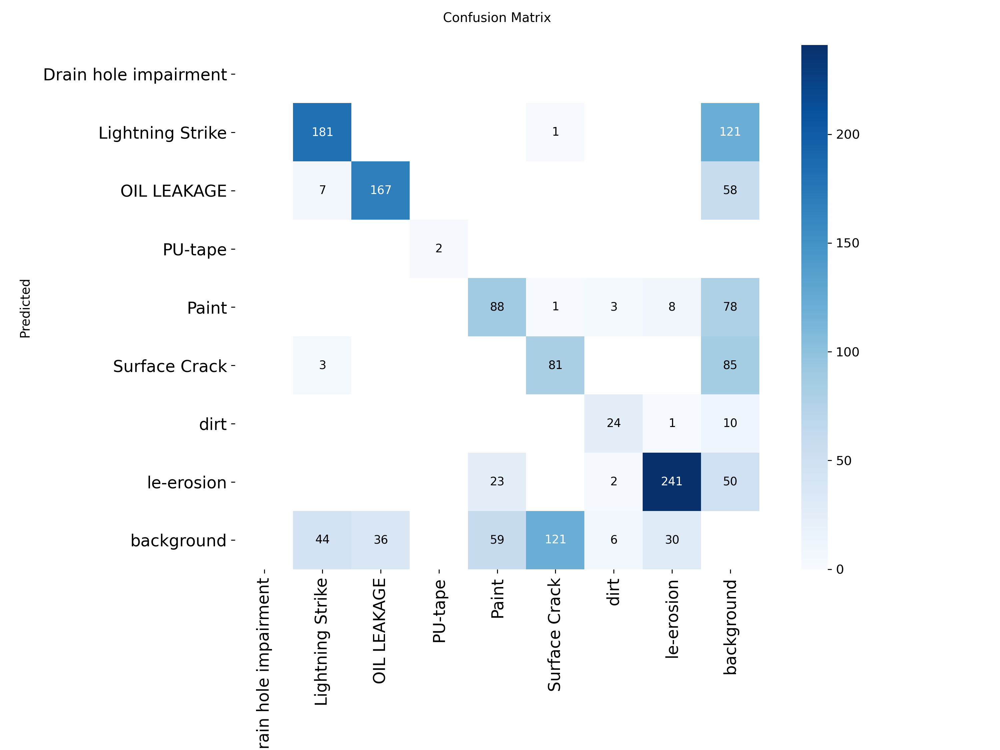

In [ ]:
# Lauren's Code — Evaluation for 7-Class Full Real-World Model (Unbalanced)

from ultralytics import YOLO
from IPython.display import Image, display
from pathlib import Path

# === Run name for THIS model ===
run_name = "train_lauren_8class_unbalanced"
run_dir  = Path("runs/detect") / run_name
weights_path = run_dir / "weights" / "best.pt"

print("Loading model from:", weights_path)

# 1) Load best weights and run numeric eval
model_eval = YOLO(str(weights_path))
metrics_la = model_eval.val(data=str(yaml_path))  # evaluate on same YAML as training

print("\n=== Lauren 8-Class Full Real-World Model (Unbalanced) — Numeric Metrics ===")
print("mAP50-95:", metrics_la.box.map)
print("mAP50   :", metrics_la.box.map50)
print("mAP75   :", metrics_la.box.map75)
print("Precision:", metrics_la.box.p)
print("Recall   :", metrics_la.box.r)
print("False alarm rate   :", 1 - metrics_la.box.p)
print("Missed damage rate :", 1 - metrics_la.box.r)

# 2) Visual metrics: confusion matrix + training curves
print("\n=== Visual Metrics ===")
cm_path = run_dir / "confusion_matrix.png"
res_path = run_dir / "results.png"

if cm_path.exists():
    display(Image(filename=str(cm_path), width=600))
else:
    print("No confusion_matrix.png found at", cm_path)


## Model 2: Riya's Model Adapted to Combined Dataset
No paint, no dirt, no drain hole


In [ ]:
# Lauren's Code — Build 5-class dataset (no Drain hole, Paint, or dirt)

from pathlib import Path
import shutil, yaml
from collections import Counter

# 8-class merged dataset root from earlier
root_8 = root
print("Source 8-class root:", root_8)

# New root for 5-class dataset
root_5 = root_8.parent / f"{root_8.name}_5class_nopaintdirt"
print("New 5-class root   :", root_5)

# Keep these original class IDs and remap to 0..4
# 1: Lightning Strike -> 0
# 2: OIL LEAKAGE      -> 1
# 3: PU-tape          -> 2
# 5: Surface Crack    -> 3
# 7: le-erosion       -> 4
keep_map = {1: 0, 2: 1, 3: 2, 5: 3, 7: 4}

# Create directory structure
for split in ["train", "valid", "test"]:
    (root_5 / split / "images").mkdir(parents=True, exist_ok=True)
    (root_5 / split / "labels").mkdir(parents=True, exist_ok=True)

def find_image_with_stem(img_dir: Path, stem: str):
    """Return first image path matching stem with common extensions."""
    for ext in [".jpg", ".jpeg", ".png"]:
        p = img_dir / f"{stem}{ext}"
        if p.exists():
            return p
    return None

# Rewrite labels and copy images
for split in ["train", "valid", "test"]:
    src_img_dir = root_8 / split / "images"
    src_lbl_dir = root_8 / split / "labels"

    dst_img_dir = root_5 / split / "images"
    dst_lbl_dir = root_5 / split / "labels"

    kept_files = 0
    skipped_files = 0
    class_counts = Counter()

    for lbl_path in src_lbl_dir.glob("*.txt"):
        with open(lbl_path, "r") as f:
            lines = f.readlines()

        new_lines = []
        for line in lines:
            parts = line.strip().split()
            if not parts:
                continue
            cls_old = int(parts[0])
            if cls_old in keep_map:
                cls_new = keep_map[cls_old]
                parts[0] = str(cls_new)
                new_lines.append(" ".join(parts) + "\n")
                class_counts[cls_new] += 1

        if not new_lines:
            # no remaining objects after dropping classes -> skip this image
            skipped_files += 1
            continue

        img_stem = lbl_path.stem
        src_img = find_image_with_stem(src_img_dir, img_stem)
        if src_img is None:
            skipped_files += 1
            continue

        dst_img = dst_img_dir / src_img.name
        dst_lbl = dst_lbl_dir / lbl_path.name

        shutil.copy2(src_img, dst_img)
        with open(dst_lbl, "w") as f:
            f.writelines(new_lines)
        kept_files += 1

    print(f"[{split}] kept {kept_files} images with at least one of the 5 classes, "
          f"skipped {skipped_files}.")
    total = sum(class_counts.values())
    if total > 0:
        print("  Class counts (new IDs):")
        for cid in sorted(class_counts):
            pct = 100 * class_counts[cid] / total
            print(f"    {cid}: {class_counts[cid]} ({pct:4.1f}%)")

# Write new 5-class YAML
yaml_5 = {
    "path": str(root_5),
    "train": "train/images",
    "val":   "valid/images",
    "test":  "test/images",
    "names": [
        "Lightning Strike",   # 0
        "OIL LEAKAGE",        # 1
        "PU-tape",            # 2
        "Surface Crack",      # 3
        "le-erosion",         # 4
    ],
}

yaml_5_path = root_5 / "data_5class.yaml"
with open(yaml_5_path, "w") as f:
    yaml.safe_dump(yaml_5, f)

print("\n5-class dataset ready.")
print("Root:", root_5)
print("YAML:", yaml_5_path)


Source 8-class root: /content/wind-combined-2
New 5-class root   : /content/wind-combined-2_5class_nopaintdirt
[train] kept 3321 images with at least one of the 5 classes, skipped 1698.
  Class counts (new IDs):
    0: 312 ( 8.2%)
    1: 720 (18.8%)
    2: 280 ( 7.3%)
    3: 603 (15.8%)
    4: 1912 (50.0%)
[valid] kept 673 images with at least one of the 5 classes, skipped 202.
  Class counts (new IDs):
    0: 235 (25.4%)
    1: 203 (22.0%)
    2: 2 ( 0.2%)
    3: 204 (22.1%)
    4: 280 (30.3%)
[test] kept 162 images with at least one of the 5 classes, skipped 136.
  Class counts (new IDs):
    0: 3 ( 1.9%)
    1: 14 ( 8.6%)
    2: 12 ( 7.4%)
    3: 5 ( 3.1%)
    4: 128 (79.0%)

5-class dataset ready.
Root: /content/wind-combined-2_5class_nopaintdirt
YAML: /content/wind-combined-2_5class_nopaintdirt/data_5class.yaml


In [ ]:
from ultralytics import YOLO

model_riya5_la = YOLO("yolov8n.pt")  # or yolov8s.pt if you want
results_riya5_la = model_riya5_la.train(
    data=str(yaml_5_path),
    epochs=30,
    imgsz=640,
    batch=16,
    device=0,
    name="train_lauren_5class_nopaintdirt"
)

Ultralytics 8.3.233 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/wind-combined-2_5class_nopaintdirt/data_5class.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train_lauren_5class_nopaintdirt, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, 

Loading model from: runs/detect/train_lauren_5class_nopaintdirt/weights/best.pt
Ultralytics 8.3.228 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
Model summary (fused): 72 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 782.4±377.7 MB/s, size: 37.6 KB)
val: Scanning /content/wind-combined-2_5class_nopaintdirt/valid/labels.cache... 673 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 673/673 922.8Kit/s 0.0s
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 338, len(boxes) = 924. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 43/43 10.0it/s 4.3s
                   all        673        924      0.711      0.766      0.791      0.497
      Lightn

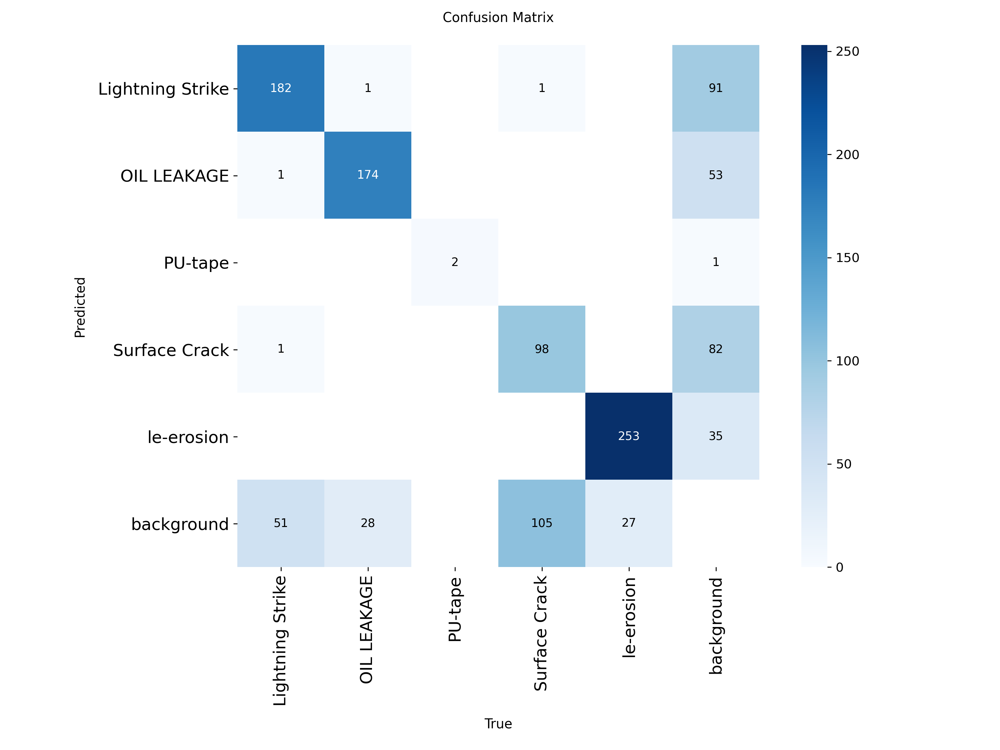

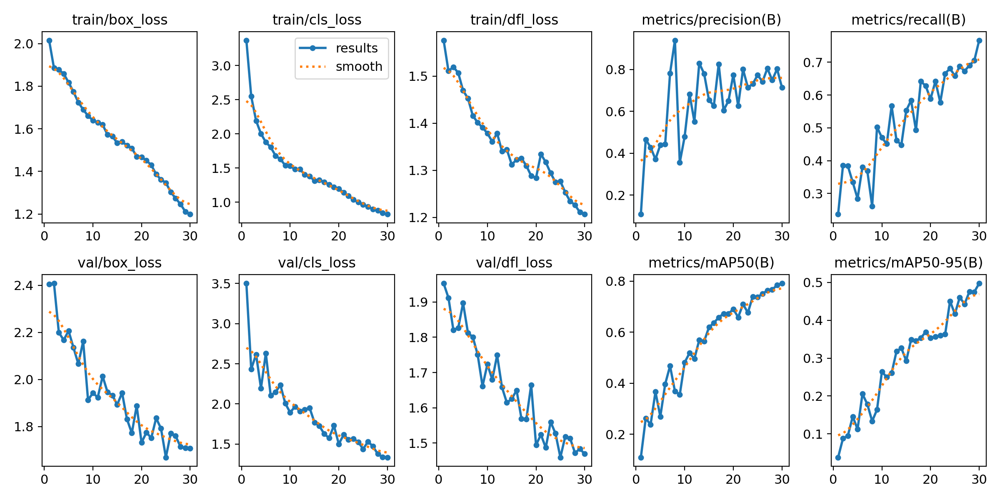


=== Example Predictions on TEST Images ===

image 1/162 /content/wind-combined-2_5class_nopaintdirt/test/images/1_JPG_jpg.rf.bacea022c9d9a2050f34456aaa94827e.jpg: 640x640 1 OIL LEAKAGE, 6.8ms
image 2/162 /content/wind-combined-2_5class_nopaintdirt/test/images/6_JPG_jpg.rf.7659465caeb075186491732645b96694.jpg: 640x640 (no detections), 7.5ms
image 3/162 /content/wind-combined-2_5class_nopaintdirt/test/images/ASP01BladeA1704205837_jpg.rf.2f186e2b562c64a8de20ca0299a4b49d.jpg: 640x640 1 le-erosion, 7.7ms
image 4/162 /content/wind-combined-2_5class_nopaintdirt/test/images/ASP01BladeC1704205824_jpg.rf.fdfb99b30d7930206f6f637602566d71.jpg: 640x640 1 le-erosion, 7.4ms
image 5/162 /content/wind-combined-2_5class_nopaintdirt/test/images/ASP02BladeA1704205898_jpg.rf.e7ef423963d218ae548ecf28dba18484.jpg: 640x640 (no detections), 7.3ms
image 6/162 /content/wind-combined-2_5class_nopaintdirt/test/images/ASP06BladeA1704299059_jpg.rf.a34121b2781f01bced6b36cc77eb69f1.jpg: 640x640 1 le-erosion, 7.0ms
im

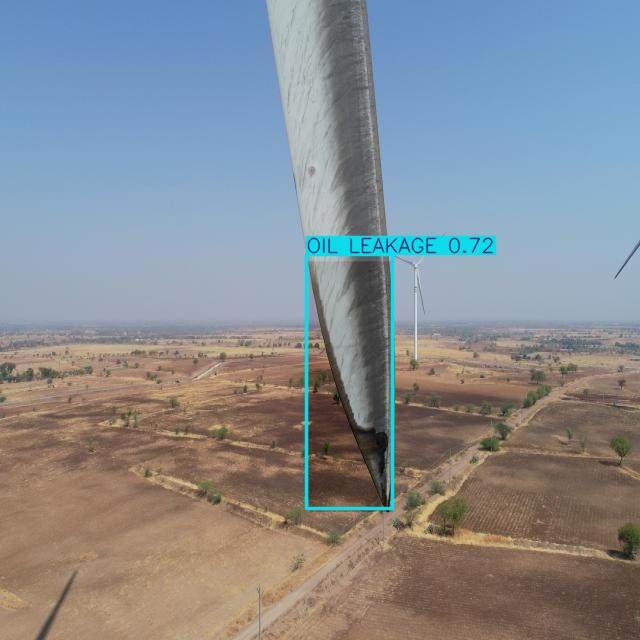

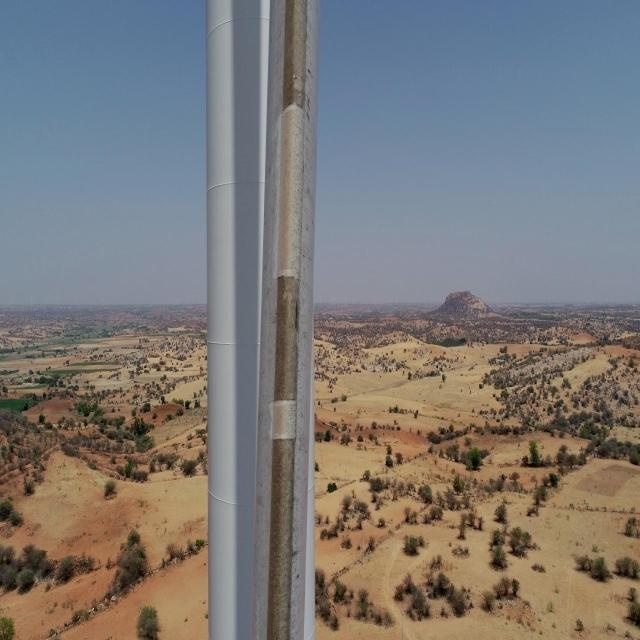

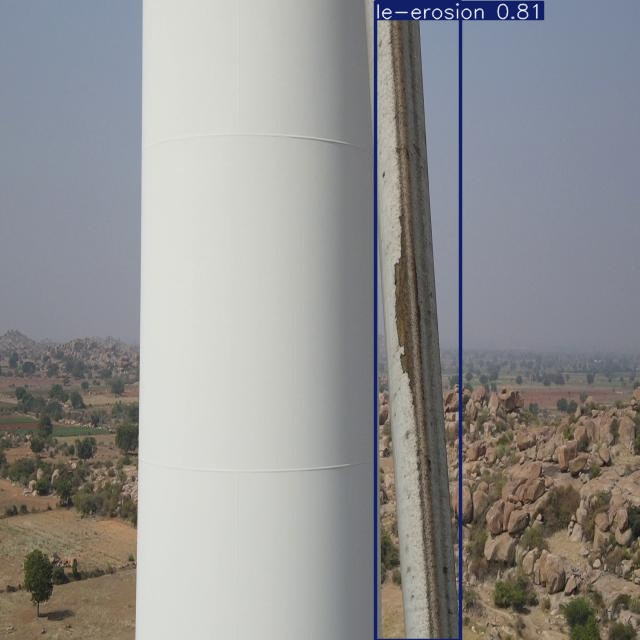

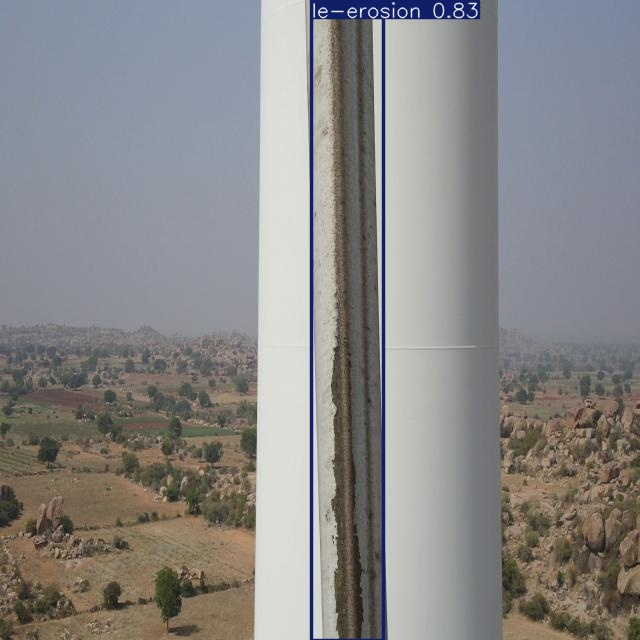

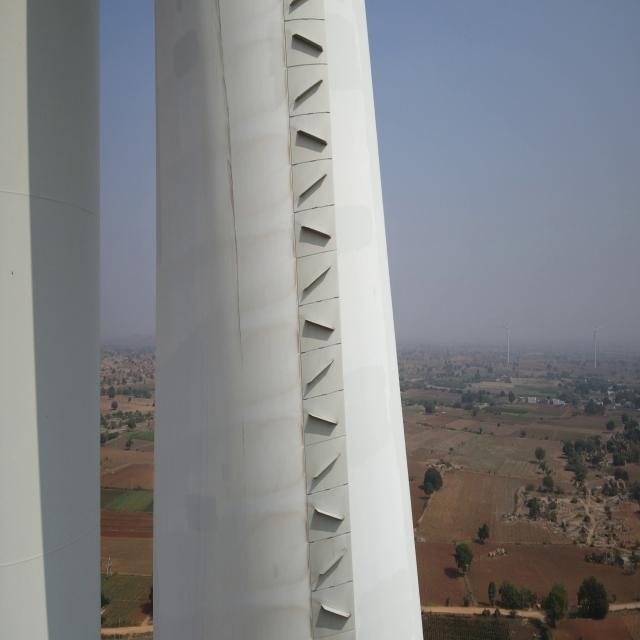

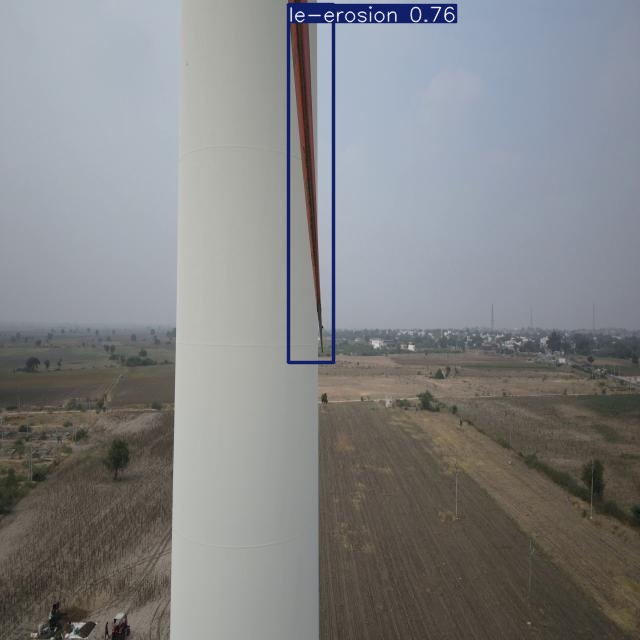

In [ ]:
# Lauren's Code — Evaluation for 5-Class No-Paint/No-Dirt Model

from ultralytics import YOLO
from IPython.display import Image, display
from pathlib import Path

# === Update this if you used a different run name ===
run_name = "train_lauren_5class_nopaintdirt"

run_dir  = Path("runs/detect") / run_name
weights_path = run_dir / "weights" / "best.pt"

print("Loading model from:", weights_path)

# Load best weights
model_eval = YOLO(str(weights_path))

# Evaluate on the 5-class YAML created earlier
yaml_5_path = root_5 / "data_5class.yaml"
metrics_5 = model_eval.val(data=str(yaml_5_path))

print("\n=== Lauren 5-Class No-Paint/No-Dirt Model — Numeric Metrics ===")
print("mAP50-95:", metrics_5.box.map)
print("mAP50   :", metrics_5.box.map50)
print("mAP75   :", metrics_5.box.map75)
print("Precision:", metrics_5.box.p)
print("Recall   :", metrics_5.box.r)
print("False alarm rate   :", 1 - metrics_5.box.p)
print("Missed damage rate :", 1 - metrics_5.box.r)

# === Visual metrics: confusion matrix + training curves ===
print("\n=== Visual Metrics ===")
cm_path = run_dir / "confusion_matrix.png"
res_path = run_dir / "results.png"

if cm_path.exists():
    display(Image(filename=str(cm_path), width=600))
else:
    print("No confusion_matrix.png found at", cm_path)

if res_path.exists():
    display(Image(filename=str(res_path), width=600))
else:
    print("No results.png found at", res_path)

# === Qualitative examples: predictions on test images ===
print("\n=== Example Predictions on TEST Images ===")

test_img_dir = root_5 / "test" / "images"

pred_results = model_eval.predict(
    source=str(test_img_dir),
    conf=0.4,
    save=True,
    name="predict_lauren_5class_nopaintdirt"
)

pred_dir = Path("runs/detect") / "predict_lauren_5class_nopaintdirt"
predicted_imgs = sorted(pred_dir.glob("*.jpg"))

for img_path in predicted_imgs[:6]:
    display(Image(filename=str(img_path), width=600))


## Model 3: Balanced Classes Without Augmentation (Dropping photos from classes with higher numbers of photos, drain hole ignored because so few examples)

In [ ]:
from pathlib import Path
import random

root = Path("/content/wind-combined-2")
labels_dir = root / "train" / "labels"
images_dir = root / "train" / "images"

# Classes to balance: skip 0 (Drain hole impairment)
balanced_classes = [1, 2, 3, 4, 5, 6, 7]

# === Step 1: map class -> set of image paths ===
class_to_images = {c: set() for c in balanced_classes}

for lbl in labels_dir.glob("*.txt"):
    img_path = images_dir / (lbl.stem + ".jpg")
    if not img_path.exists():
        continue

    with open(lbl, "r") as f:
        cls_ids = {int(line.split()[0]) for line in f if line.strip()}

    for c in cls_ids:
        if c in balanced_classes:
            class_to_images[c].add(str(img_path))

# === Step 2: Determine minority class size ===
n_per_class = min(len(imgs) for imgs in class_to_images.values() if len(imgs) > 0)

print("Using", n_per_class, "images per class (auto-detected minimum)")

# === Step 3: sample equal number for each class ===
balanced_images = set()

for c in balanced_classes:
    imgs = list(class_to_images[c])
    if len(imgs) <= n_per_class:
        chosen = imgs
        print(f"Class {c}: using all {len(imgs)} images")
    else:
        chosen = random.sample(imgs, n_per_class)
        print(f"Class {c}: sampled {n_per_class} images from {len(imgs)}")

    balanced_images.update(chosen)

print("Total balanced images:", len(balanced_images))

# === Step 4: write train_balanced.txt ===
balanced_list_path = root / "train_balanced.txt"
with open(balanced_list_path, "w") as f:
    for p in sorted(balanced_images):
        f.write(p + "\n")

print("Balanced file written to:", balanced_list_path)

Using 231 images per class (auto-detected minimum)
Class 1: using all 231 images
Class 2: sampled 231 images from 528
Class 3: sampled 231 images from 280
Class 4: sampled 231 images from 1146
Class 5: sampled 231 images from 398
Class 6: sampled 231 images from 502
Class 7: sampled 231 images from 1902
Total balanced images: 1608
Balanced file written to: /content/wind-combined-2/train_balanced.txt


In [ ]:
from copy import deepcopy
import yaml
from pathlib import Path

root = Path("/content/wind-combined-2")
balanced_list_path = root / "train_balanced.txt"

# Load original YAML
yaml_path = root / "data.yaml"
with open(yaml_path, "r") as f:
    data_yaml = yaml.safe_load(f)

# Make a balanced version
data_balanced = deepcopy(data_yaml)

# Important bit: tell YOLO to use the text file of image paths
# You can make this either an absolute path or relative. Both work.
data_balanced["train"] = str(balanced_list_path)

# Keep val/test exactly the same as original (good for fair comparison)
print("Original train:", data_yaml["train"])
print("Balanced train:", data_balanced["train"])

# Save to a new YAML
yaml_balanced_path = root / "data_balanced_8class_equal231.yaml"
with open(yaml_balanced_path, "w") as f:
    yaml.safe_dump(data_balanced, f)

print("Balanced YAML written to:", yaml_balanced_path)


Original train: ../train/images
Balanced train: /content/wind-combined-2/train_balanced.txt
Balanced YAML written to: /content/wind-combined-2/data_balanced_8class_equal231.yaml


In [ ]:
from ultralytics import YOLO

print("Training using balanced YAML:", yaml_balanced_path)

model_balanced = YOLO("yolov8n.pt")

results_balanced = model_balanced.train(
    data=str(yaml_balanced_path),
    epochs=30,          # same as your unbalanced model
    imgsz=640,
    batch=16,
    device=0,           # GPU
    name="train_lauren_8class_balanced_equal231"  # new run name
)

print("Training complete! Model saved to:", model_balanced)

Training using balanced YAML: /content/wind-combined-2/data_balanced_8class_equal231.yaml
Ultralytics 8.3.230 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/wind-combined-2/data_balanced_8class_equal231.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train_l

Loading balanced model from: runs/detect/train_lauren_8class_balanced_equal231/weights/best.pt
Ultralytics 8.3.230 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
Model summary (fused): 72 layers, 3,007,208 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1433.7±543.5 MB/s, size: 36.2 KB)
val: Scanning /content/wind-combined-2/valid/labels.cache... 875 images, 7 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 875/875 2.2Mit/s 0.0s
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 543, len(boxes) = 1129. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 55/55 11.3it/s 4.9s
                   all        875       1129      0.693      0.601      0.641      0.362
      Lightning 

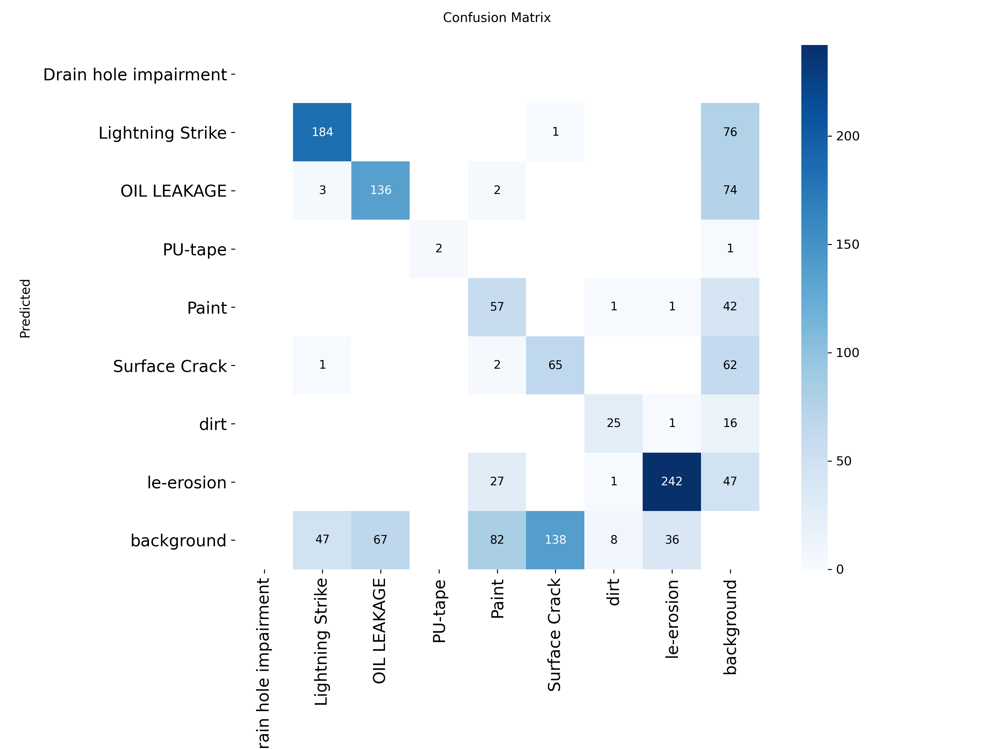

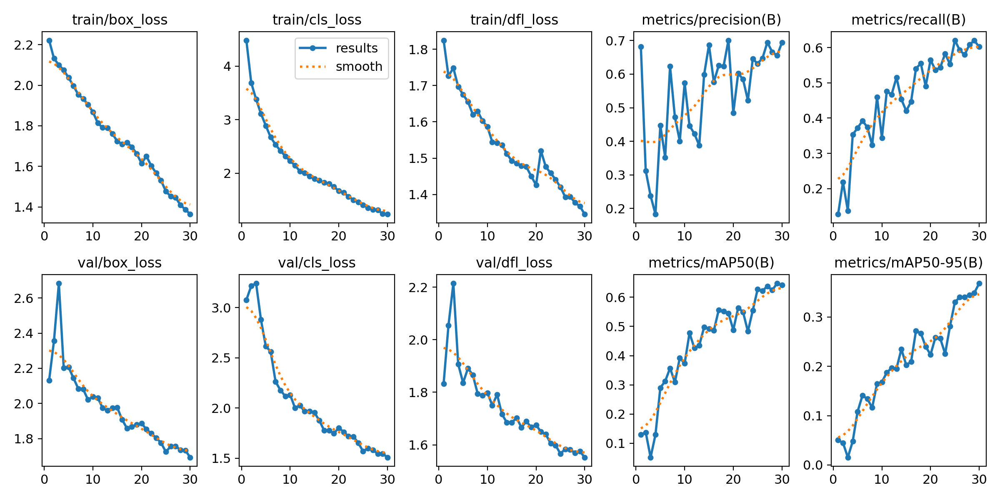

In [ ]:
from ultralytics import YOLO
from pathlib import Path
from IPython.display import Image, display
import numpy as np

run_name = "train_lauren_8class_balanced_equal231"
run_dir = Path("runs/detect") / run_name
weights_path = run_dir / "weights" / "best.pt"

print("Loading balanced model from:", weights_path)

model_eval_bal = YOLO(str(weights_path))

# Use the same *balanced* YAML we trained with
metrics_bal = model_eval_bal.val(data=str(yaml_balanced_path))

print("\n=== Lauren 8-Class Balanced Model (Equal 231 per Class) — Numeric Metrics ===")
print("mAP50-95:", metrics_bal.box.map)
print("mAP50   :", metrics_bal.box.map50)
print("mAP75   :", metrics_bal.box.map75)
print("Precision:", metrics_bal.box.p)
print("Recall   :", metrics_bal.box.r)
print("False alarm rate   :", 1 - metrics_bal.box.p)
print("Missed damage rate :", 1 - metrics_bal.box.r)

print("\n=== Visual Metrics ===")
cm_path = run_dir / "confusion_matrix.png"
res_path = run_dir / "results.png"

if cm_path.exists():
    display(Image(filename=str(cm_path), width=600))
else:
    print("No confusion_matrix.png found at", cm_path)

if res_path.exists():
    display(Image(filename=str(res_path), width=600))
else:
    print("No results.png found at", res_path)


In [ ]:
# === Severity-based evaluation (severe vs not-severe) ===
# Severe: Lightning Strike (1), Surface Crack (5), le-erosion (7)
# Non-severe: all other classes (0, 2, 3, 4, 6)

cm = getattr(metrics_bal, "confusion_matrix", None)

if cm is not None and getattr(cm, "matrix", None) is not None:
    cm_mat = cm.matrix  # shape: (nc, nc), rows = true, cols = pred

    severe_ids    = [1, 5, 7]
    nonsevere_ids = [0, 2, 3, 4, 6]

    severe_idx    = np.ix_(severe_ids, severe_ids)
    severe_to_non = np.ix_(severe_ids, nonsevere_ids)
    non_to_severe = np.ix_(nonsevere_ids, severe_ids)
    non_to_non    = np.ix_(nonsevere_ids, nonsevere_ids)

    # Collapse 8x8 → 2x2
    TP = float(cm_mat[severe_idx].sum())
    FN = float(cm_mat[severe_to_non].sum())
    FP = float(cm_mat[non_to_severe].sum())
    TN = float(cm_mat[non_to_non].sum())

    # Metrics
    precision_severe = TP / (TP + FP) if (TP + FP) > 0 else float("nan")
    recall_severe    = TP / (TP + FN) if (TP + FN) > 0 else float("nan")
    f1_severe        = (
        2 * precision_severe * recall_severe / (precision_severe + recall_severe)
        if (precision_severe + recall_severe) > 0 else float("nan")
    )

    # Print integers safely
    print("\n=== Severe vs Not-Severe Confusion (Instance-Level) ===")
    print("               Pred Severe   Pred Not-Severe")
    print(f"True Severe    {int(TP):10d}   {int(FN):15d}")
    print(f"True Not-Sev   {int(FP):10d}   {int(TN):15d}")

    print("\n=== Severe-Class Metrics (treating 'severe' as positive) ===")
    print(f"Precision_severe : {precision_severe:.3f}")
    print(f"Recall_severe    : {recall_severe:.3f}")
    print(f"F1_severe        : {f1_severe:.3f}")

else:
    print("\nNo in-memory confusion matrix available on metrics_bal.")



=== Severe vs Not-Severe Confusion (Instance-Level) ===
               Pred Severe   Pred Not-Severe
True Severe           493                30
True Not-Sev            5               222

=== Severe-Class Metrics (treating 'severe' as positive) ===
Precision_severe : 0.990
Recall_severe    : 0.943
F1_severe        : 0.966


In [ ]:
import os

search_root = "runs/detect"
found = []

for root, dirs, files in os.walk(search_root):
    for f in files:
        if f == "confusion_matrix.npy":
            found.append(os.path.join(root, f))

print("Found confusion matrices:")
for p in found:
    print(p)


Found confusion matrices:


## Model 4: Balanced Classes WITH Augmentation (For all classes except drain hole)

In [ ]:
from pathlib import Path
import random
from collections import defaultdict

random.seed(42)

root = Path("/content/wind-combined-2")
labels_dir = root / "train" / "labels"
images_dir = root / "train" / "images"

# We still ignore class 0 (drain hole) for rebalancing, since it's tiny
balanced_classes = [1, 2, 3, 4, 5, 6, 7]

# === Step 1: map class -> list of image paths (not set; we want ordered lists) ===
class_to_images = {c: [] for c in balanced_classes}

for lbl in labels_dir.glob("*.txt"):
    img_path = images_dir / (lbl.stem + ".jpg")
    if not img_path.exists():
        continue

    with open(lbl, "r") as f:
        cls_ids = {int(line.split()[0]) for line in f if line.strip()}

    for c in cls_ids:
        if c in balanced_classes:
            class_to_images[c].append(str(img_path))

# Quick sanity print
for c in balanced_classes:
    print(f"Class {c}: {len(class_to_images[c])} images")

# === Step 2: choose target images per class ===

# Option A: full max (what you asked for)
max_images = max(len(imgs) for imgs in class_to_images.values() if len(imgs) > 0)

# If you ever want a cap like 3x minority, you could do it here:
# min_images = min(len(imgs) for imgs in class_to_images.values() if len(imgs) > 0)
# target_per_class = min(max_images, 3 * min_images)
# For now, use full max:
target_per_class = max_images

print(f"\nTarget images per class: {target_per_class} (max over classes)")

# === Step 3: oversample each class to target_per_class (with replacement) ===
oversampled_paths = []

for c in balanced_classes:
    imgs = class_to_images[c]
    n = len(imgs)

    if n == 0:
        print(f"Warning: class {c} has 0 images, skipping.")
        continue

    # number of full repeats + remainder
    reps = target_per_class // n
    rem  = target_per_class % n

    class_list = []

    # Full repeats
    for _ in range(reps):
        class_list.extend(imgs)

    # Remainder: sample without replacement if possible
    if rem > 0:
        if rem <= n:
            class_list.extend(random.sample(imgs, rem))
        else:
            # Fallback; shouldn't really happen since rem < n
            class_list.extend(random.choices(imgs, k=rem))

    oversampled_paths.extend(class_list)
    print(f"Class {c}: base {n}, oversampled to {len(class_list)} entries")

print(f"\nTotal oversampled entries (with repetition): {len(oversampled_paths)}")

# === Step 4: write oversampled train list ===
oversampled_list_path = root / "train_balanced_oversampled_max.txt"
with open(oversampled_list_path, "w") as f:
    for p in oversampled_paths:
        f.write(p + "\n")

print("Oversampled file written to:", oversampled_list_path)


Class 1: 231 images
Class 2: 528 images
Class 3: 280 images
Class 4: 1146 images
Class 5: 398 images
Class 6: 502 images
Class 7: 1902 images

Target images per class: 1902 (max over classes)
Class 1: base 231, oversampled to 1902 entries
Class 2: base 528, oversampled to 1902 entries
Class 3: base 280, oversampled to 1902 entries
Class 4: base 1146, oversampled to 1902 entries
Class 5: base 398, oversampled to 1902 entries
Class 6: base 502, oversampled to 1902 entries
Class 7: base 1902, oversampled to 1902 entries

Total oversampled entries (with repetition): 13314
Oversampled file written to: /content/wind-combined-2/train_balanced_oversampled_max.txt


In [ ]:
import yaml
from copy import deepcopy
from pathlib import Path

root = Path("/content/wind-combined-2")
yaml_path = root / "data.yaml"

with open(yaml_path, "r") as f:
    base_yaml = yaml.safe_load(f)

data_oversampled = deepcopy(base_yaml)
data_oversampled["train"] = str(oversampled_list_path)  # list we just wrote

yaml_oversampled_path = root / "data_8class_oversampled_max.yaml"
with open(yaml_oversampled_path, "w") as f:
    yaml.safe_dump(data_oversampled, f)

print("Oversampled YAML written to:", yaml_oversampled_path)


Oversampled YAML written to: /content/wind-combined-2/data_8class_oversampled_max.yaml


In [ ]:
from ultralytics import YOLO

print("Training using oversampled YAML:", yaml_oversampled_path)

model_os = YOLO("yolov8n.pt")

results_os = model_os.train(
    data=str(yaml_oversampled_path),
    epochs=30,
    imgsz=640,
    batch=16,
    device=0,
    name="train_lauren_8class_oversampled_max"
)

print("Training complete! Model saved to:", model_os)


Training using oversampled YAML: /content/wind-combined-2/data_8class_oversampled_max.yaml
Ultralytics 8.3.230 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/wind-combined-2/data_8class_oversampled_max.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train_la

Loading oversampled model from: runs/detect/train_lauren_8class_oversampled_max/weights/best.pt
Using YAML: /content/wind-combined-2/data_8class_oversampled_max.yaml
Ultralytics 8.3.230 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
Model summary (fused): 72 layers, 3,007,208 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1474.1±490.1 MB/s, size: 37.7 KB)
val: Scanning /content/wind-combined-2/valid/labels.cache... 875 images, 7 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 875/875 2.3Mit/s 0.0s
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 543, len(boxes) = 1129. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 55/55 11.4it/s 4.8s
                   all        875 

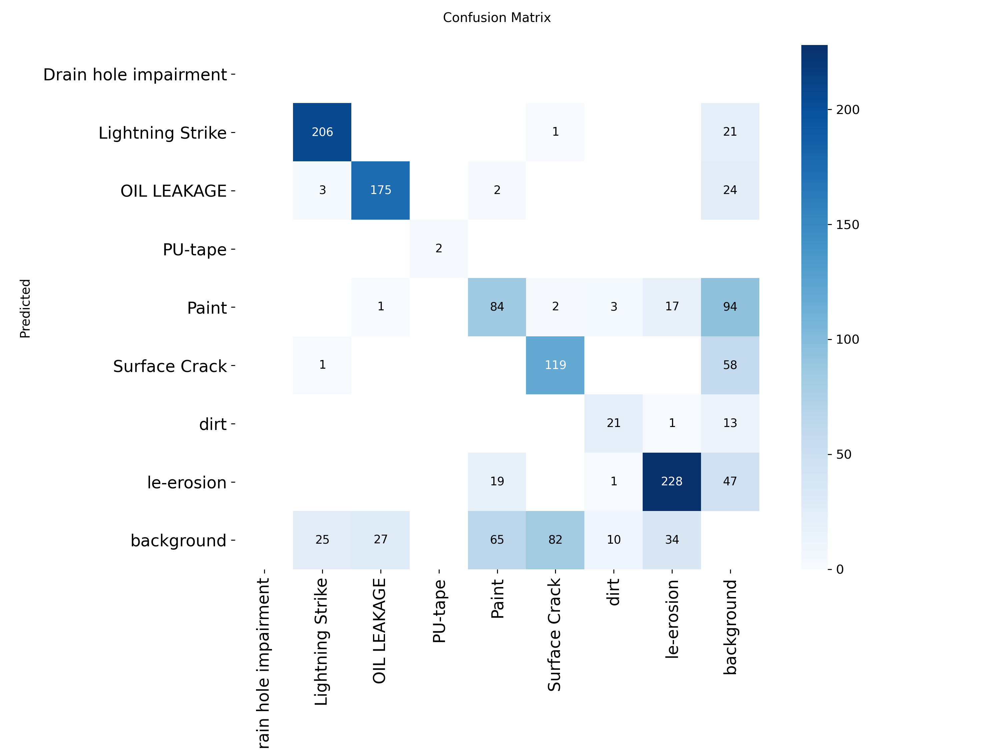

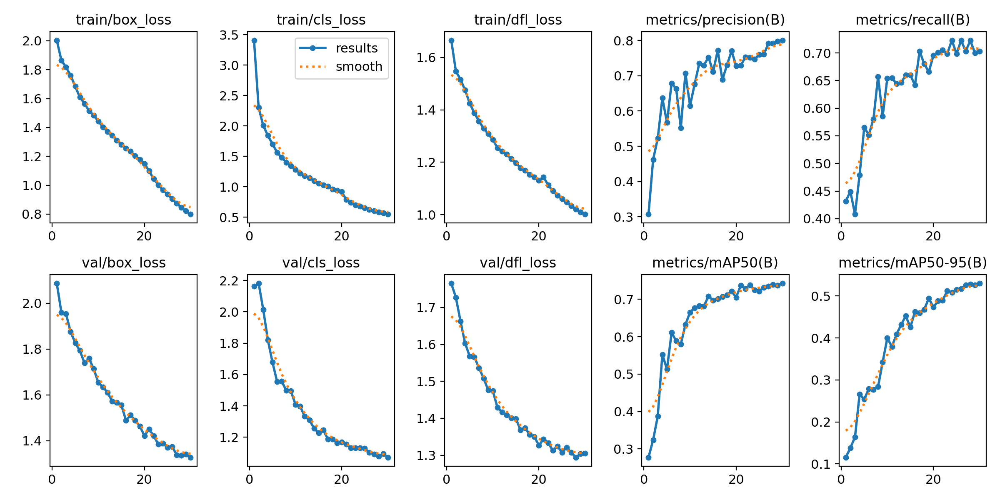

In [ ]:
# Lauren's Code — Evaluation for 8-Class Oversampled + Augmented Model

from ultralytics import YOLO
from IPython.display import Image, display
from pathlib import Path

# === Adjust these if you changed names/paths ===
root = Path("/content/wind-combined-2")
yaml_oversampled_path = root / "data_8class_oversampled_max.yaml"

run_name = "train_lauren_8class_oversampled_max"
run_dir = Path("runs/detect") / run_name
weights_path = run_dir / "weights" / "best.pt"

print("Loading oversampled model from:", weights_path)
print("Using YAML:", yaml_oversampled_path)

# 1) Load best weights and run numeric eval
model_eval_os = YOLO(str(weights_path))
metrics_os = model_eval_os.val(data=str(yaml_oversampled_path))

print("\n=== Lauren 8-Class Oversampled + Augmented Model — Numeric Metrics ===")
print("mAP50-95:", metrics_os.box.map)
print("mAP50   :", metrics_os.box.map50)
print("mAP75   :", metrics_os.box.map75)
print("Precision:", metrics_os.box.p)
print("Recall   :", metrics_os.box.r)
print("False alarm rate   :", 1 - metrics_os.box.p)
print("Missed damage rate :", 1 - metrics_os.box.r)

# 2) Visual metrics: confusion matrix + training curves
print("\n=== Visual Metrics ===")
cm_path = run_dir / "confusion_matrix.png"
res_path = run_dir / "results.png"

if cm_path.exists():
    display(Image(filename=str(cm_path), width=600))
else:
    print("No confusion_matrix.png found at", cm_path)

if res_path.exists():
    display(Image(filename=str(res_path), width=600))
else:
    print("No results.png found at", res_path)


In [ ]:
# 3) Severity-based evaluation (severe vs not-severe)
# Severe: Lightning Strike (1), Surface Crack (5), le-erosion (7)
# Non-severe: all other classes (0, 2, 3, 4, 6)

cm = getattr(metrics_os, "confusion_matrix", None)

if cm is not None and getattr(cm, "matrix", None) is not None:
    cm_mat = cm.matrix  # shape: (nc, nc), rows = true, cols = pred

    severe_ids    = [1, 5, 7]
    nonsevere_ids = [0, 2, 3, 4, 6]

    severe_idx    = np.ix_(severe_ids, severe_ids)
    severe_to_non = np.ix_(severe_ids, nonsevere_ids)
    non_to_severe = np.ix_(nonsevere_ids, severe_ids)
    non_to_non    = np.ix_(nonsevere_ids, nonsevere_ids)

    # Collapse 8x8 → 2x2
    TP = float(cm_mat[severe_idx].sum())      # true severe → predicted severe
    FN = float(cm_mat[severe_to_non].sum())   # true severe → predicted non-severe
    FP = float(cm_mat[non_to_severe].sum())   # true non-severe → predicted severe
    TN = float(cm_mat[non_to_non].sum())      # true non-severe → predicted non-severe

    # Metrics
    precision_severe = TP / (TP + FP) if (TP + FP) > 0 else float("nan")
    recall_severe    = TP / (TP + FN) if (TP + FN) > 0 else float("nan")
    f1_severe        = (
        2 * precision_severe * recall_severe / (precision_severe + recall_severe)
        if (precision_severe + recall_severe) > 0 else float("nan")
    )

    print("\n=== Severe vs Not-Severe Confusion (Instance-Level) ===")
    print("               Pred Severe   Pred Not-Severe")
    print(f"True Severe    {int(TP):10d}   {int(FN):15d}")
    print(f"True Not-Sev   {int(FP):10d}   {int(TN):15d}")

    print("\n=== Severe-Class Metrics (treating 'severe' as positive) ===")
    print(f"Precision_severe : {precision_severe:.3f}")
    print(f"Recall_severe    : {recall_severe:.3f}")
    print(f"F1_severe        : {f1_severe:.3f}")
else:
    print("\nNo in-memory confusion matrix available on metrics_os.")


=== Severe vs Not-Severe Confusion (Instance-Level) ===
               Pred Severe   Pred Not-Severe
True Severe           556                19
True Not-Sev           21               288

=== Severe-Class Metrics (treating 'severe' as positive) ===
Precision_severe : 0.964
Recall_severe    : 0.967
F1_severe        : 0.965


## Model 5: Balanced Classes Without Augmentation (Dropping photos from classes with higher numbers of photos, DROPPED CLASSES: drain hole, paint, dirt)

In [ ]:
from pathlib import Path
import shutil, yaml
from collections import Counter

# Original 8-class dataset
root_8 = Path("/content/wind-combined-2")

# New 5-class dataset that drops drain hole, Paint, dirt
root_5 = root_8.parent / f"{root_8.name}_5class_nodrain_paint_dirt"

print("Source 8-class root:", root_8)
print("New 5-class root   :", root_5)

# Keep these original class IDs and remap to 0..4:
# 1: Lightning Strike -> 0
# 2: OIL LEAKAGE      -> 1
# 3: PU-tape          -> 2
# 5: Surface Crack    -> 3
# 7: le-erosion       -> 4
keep_map = {1: 0, 2: 1, 3: 2, 5: 3, 7: 4}

# Create directory structure
for split in ["train", "valid", "test"]:
    (root_5 / split / "images").mkdir(parents=True, exist_ok=True)
    (root_5 / split / "labels").mkdir(parents=True, exist_ok=True)

def find_image_with_stem(img_dir: Path, stem: str):
    for ext in [".jpg", ".jpeg", ".png"]:
        p = img_dir / f"{stem}{ext}"
        if p.exists():
            return p
    return None

class_counts = Counter()

for split in ["train", "valid", "test"]:
    src_img_dir = root_8 / split / "images"
    src_lbl_dir = root_8 / split / "labels"
    dst_img_dir = root_5 / split / "images"
    dst_lbl_dir = root_5 / split / "labels"

    kept_files = 0
    skipped_files = 0

    for lbl_path in src_lbl_dir.glob("*.txt"):
        with open(lbl_path, "r") as f:
            lines = f.readlines()

        new_lines = []
        for line in lines:
            parts = line.strip().split()
            if not parts:
                continue
            cls_old = int(parts[0])

            if cls_old in keep_map:
                cls_new = keep_map[cls_old]
                parts[0] = str(cls_new)
                new_lines.append(" ".join(parts) + "\n")
                class_counts[cls_new] += 1

        # If no kept classes remain in this image, skip it
        if not new_lines:
            skipped_files += 1
            continue

        img_stem = lbl_path.stem
        src_img = find_image_with_stem(src_img_dir, img_stem)
        if src_img is None:
            skipped_files += 1
            continue

        dst_img = dst_img_dir / src_img.name
        dst_lbl = dst_lbl_dir / lbl_path.name

        shutil.copy2(src_img, dst_img)
        with open(dst_lbl, "w") as f:
            f.writelines(new_lines)

        kept_files += 1

    print(f"[{split}] kept {kept_files} images with at least one of the 5 classes, skipped {skipped_files}.")

total = sum(class_counts.values())
if total > 0:
    print("\nClass counts (5-class, new IDs):")
    for cid in sorted(class_counts):
        pct = 100 * class_counts[cid] / total
        print(f"  {cid}: {class_counts[cid]} ({pct:4.1f}%)")

# Write new 5-class YAML
yaml_5 = {
    "path": str(root_5),
    "train": "train/images",
    "val": "valid/images",
    "test": "test/images",
    "names": [
        "Lightning Strike",  # 0
        "OIL LEAKAGE",       # 1
        "PU-tape",           # 2
        "Surface Crack",     # 3
        "le-erosion",        # 4
    ],
    "nc": 5,
}
yaml_5_path = root_5 / "data_5class.yaml"
with open(yaml_5_path, "w") as f:
    yaml.safe_dump(yaml_5, f)

print("\n5-class dataset ready.")
print("Root:", root_5)
print("YAML:", yaml_5_path)


Source 8-class root: /content/wind-combined-2
New 5-class root   : /content/wind-combined-2_5class_nodrain_paint_dirt
[train] kept 3321 images with at least one of the 5 classes, skipped 1698.
[valid] kept 673 images with at least one of the 5 classes, skipped 202.
[test] kept 162 images with at least one of the 5 classes, skipped 136.

Class counts (5-class, new IDs):
  0: 550 (11.2%)
  1: 937 (19.1%)
  2: 294 ( 6.0%)
  3: 812 (16.5%)
  4: 2320 (47.2%)

5-class dataset ready.
Root: /content/wind-combined-2_5class_nodrain_paint_dirt
YAML: /content/wind-combined-2_5class_nodrain_paint_dirt/data_5class.yaml


In [ ]:
from pathlib import Path
import random

random.seed(42)

root_5 = Path("/content/wind-combined-2_5class_nodrain_paint_dirt")
labels_dir_5 = root_5 / "train" / "labels"
images_dir_5 = root_5 / "train" / "images"

balanced_classes_5 = [0, 1, 2, 3, 4]

# Step 1: class -> set of image paths
class_to_images_5 = {c: set() for c in balanced_classes_5}

for lbl in labels_dir_5.glob("*.txt"):
    stem = lbl.stem

    img_path = None
    for ext in [".jpg", ".jpeg", ".png"]:
        candidate = images_dir_5 / f"{stem}{ext}"
        if candidate.exists():
            img_path = candidate
            break

    if img_path is None:
        continue

    with open(lbl, "r") as f:
        cls_ids = {int(line.split()[0]) for line in f if line.strip()}

    for c in cls_ids:
        if c in balanced_classes_5:
            class_to_images_5[c].add(str(img_path))

print("Image counts per class (5-class, pre-balance):")
for c in balanced_classes_5:
    print(f"Class {c}: {len(class_to_images_5[c])} images")

# Step 2: determine minority size
nonempty_counts = [len(imgs) for imgs in class_to_images_5.values() if len(imgs) > 0]
if not nonempty_counts:
    raise ValueError("No images found in any class for the 5-class dataset.")

n_per_class_5 = min(nonempty_counts)
print("\nUsing", n_per_class_5, "images per class (auto-detected minimum among 5 classes)")

# Step 3: sample equal number for each class
balanced_images_5 = set()

for c in balanced_classes_5:
    imgs = list(class_to_images_5[c])
    if len(imgs) <= n_per_class_5:
        chosen = imgs
        print(f"Class {c}: using all {len(imgs)} images")
    else:
        chosen = random.sample(imgs, n_per_class_5)
        print(f"Class {c}: sampled {n_per_class_5} images from {len(imgs)}")

    balanced_images_5.update(chosen)

print("\nTotal unique balanced train images (5-class):", len(balanced_images_5))

# Step 4: write balanced train list
balanced_list_5_path = root_5 / "train_balanced_5class_equal.txt"
with open(balanced_list_5_path, "w") as f:
    for p in sorted(balanced_images_5):
        f.write(p + "\n")

print("Balanced 5-class train list written to:", balanced_list_5_path)


Image counts per class (5-class, pre-balance):
Class 0: 231 images
Class 1: 528 images
Class 2: 280 images
Class 3: 398 images
Class 4: 1902 images

Using 231 images per class (auto-detected minimum among 5 classes)
Class 0: using all 231 images
Class 1: sampled 231 images from 528
Class 2: sampled 231 images from 280
Class 3: sampled 231 images from 398
Class 4: sampled 231 images from 1902

Total unique balanced train images (5-class): 1149
Balanced 5-class train list written to: /content/wind-combined-2_5class_nodrain_paint_dirt/train_balanced_5class_equal.txt


In [ ]:
import yaml
from copy import deepcopy
from pathlib import Path

root_5 = Path("/content/wind-combined-2_5class_nodrain_paint_dirt")
yaml_5_path = root_5 / "data_5class.yaml"

# Load original 5-class YAML
with open(yaml_5_path, "r") as f:
    data_5 = yaml.safe_load(f)

# Make a balanced version that uses the balanced train list
data_5_bal = deepcopy(data_5)
data_5_bal["train"] = str(balanced_list_5_path)  # from previous cell

yaml_5_balanced_path = root_5 / "data_5class_balanced_equal.yaml"
with open(yaml_5_balanced_path, "w") as f:
    yaml.safe_dump(data_5_bal, f)

print("Balanced 5-class YAML written to:", yaml_5_balanced_path)
print("train:", data_5_bal["train"])
print("val  :", data_5_bal["val"])
print("test :", data_5_bal.get("test", "(none)"))


Balanced 5-class YAML written to: /content/wind-combined-2_5class_nodrain_paint_dirt/data_5class_balanced_equal.yaml
train: /content/wind-combined-2_5class_nodrain_paint_dirt/train_balanced_5class_equal.txt
val  : valid/images
test : test/images


In [ ]:
from ultralytics import YOLO

print("Training 5-class balanced model using:", yaml_5_balanced_path)

model_5_bal = YOLO("yolov8n.pt")  # or yolov8s.pt if you want

results_5_bal = model_5_bal.train(
    data=str(yaml_5_balanced_path),
    epochs=30,
    imgsz=640,
    batch=16,
    device=0,
    name="train_lauren_5class_balanced_equal_nodrainpaintdirt"
)

print("Training complete! Model saved to:", model_5_bal)


Training 5-class balanced model using: /content/wind-combined-2_5class_nodrain_paint_dirt/data_5class_balanced_equal.yaml
Ultralytics 8.3.232 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/wind-combined-2_5class_nodrain_paint_dirt/data_5class_balanced_equal.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, mome

Loading 5-class balanced model from: runs/detect/train_lauren_5class_balanced_equal_nodrainpaintdirt/weights/best.pt
Using YAML: /content/wind-combined-2_5class_nodrain_paint_dirt/data_5class_balanced_equal.yaml
Ultralytics 8.3.232 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
Model summary (fused): 72 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1106.3±556.4 MB/s, size: 37.7 KB)
val: Scanning /content/wind-combined-2_5class_nodrain_paint_dirt/valid/labels.cache... 673 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 673/673 1.5Mit/s 0.0s
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 338, len(boxes) = 924. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 1

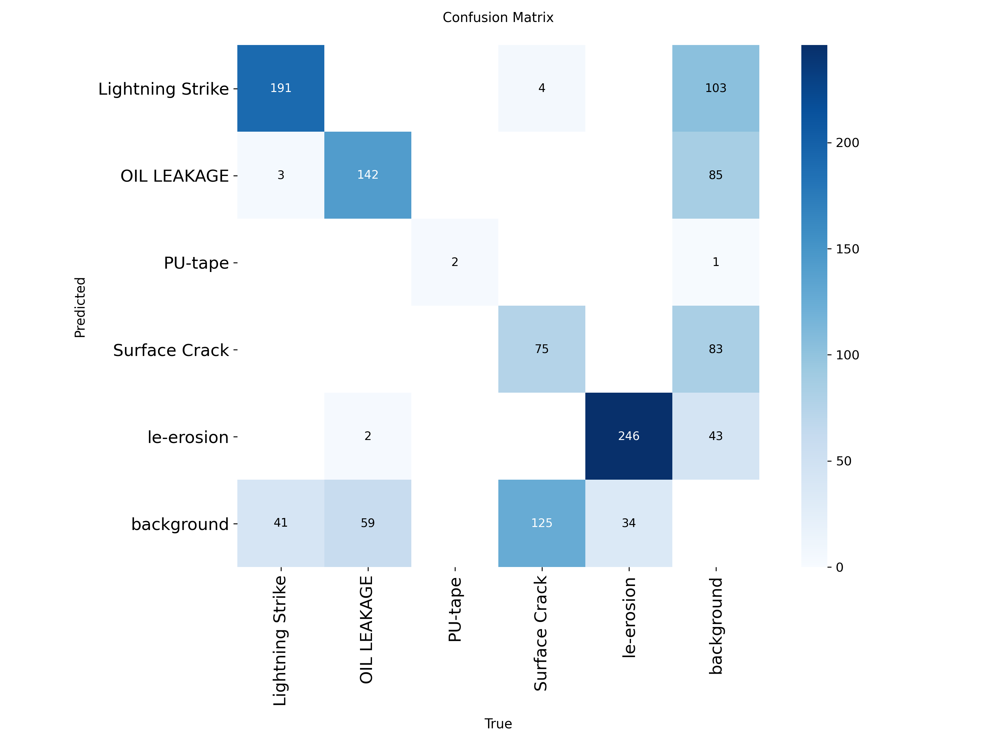

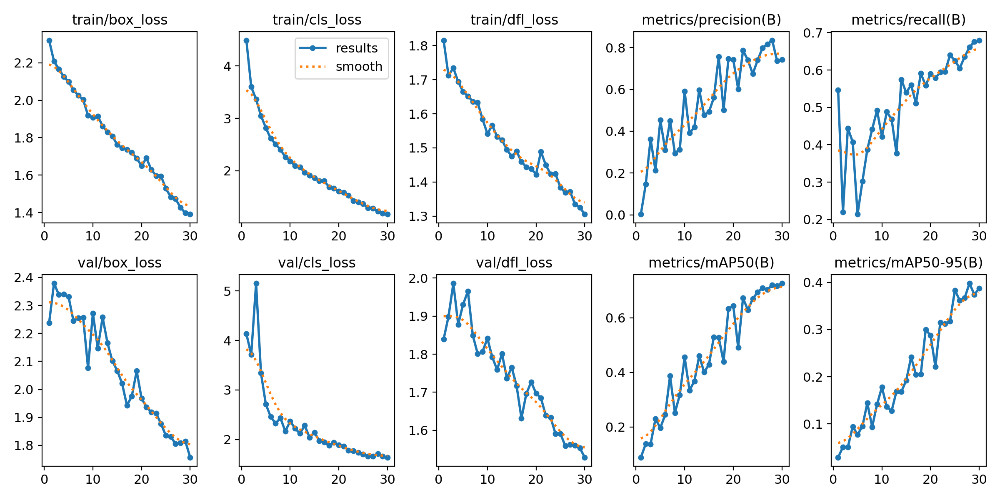

In [ ]:
# Lauren's Code — Evaluation for 5-Class Balanced Model (No Drain/Paint/Dirt)

from ultralytics import YOLO
from IPython.display import Image, display
from pathlib import Path
import numpy as np

root_5 = Path("/content/wind-combined-2_5class_nodrain_paint_dirt")
yaml_5_balanced_path = root_5 / "data_5class_balanced_equal.yaml"

run_name = "train_lauren_5class_balanced_equal_nodrainpaintdirt"
run_dir = Path("runs/detect") / run_name
weights_path = run_dir / "weights" / "best.pt"

print("Loading 5-class balanced model from:", weights_path)
print("Using YAML:", yaml_5_balanced_path)

# 1) Load best weights and run numeric eval
model_eval_5 = YOLO(str(weights_path))
metrics_5 = model_eval_5.val(data=str(yaml_5_balanced_path))

print("\n=== Lauren 5-Class Balanced Model (No Drain/Paint/Dirt) — Numeric Metrics ===")
print("mAP50-95:", metrics_5.box.map)
print("mAP50   :", metrics_5.box.map50)
print("mAP75   :", metrics_5.box.map75)
print("Precision:", metrics_5.box.p)
print("Recall   :", metrics_5.box.r)
print("False alarm rate   :", 1 - metrics_5.box.p)
print("Missed damage rate :", 1 - metrics_5.box.r)

# 2) Visual metrics: confusion matrix + training curves
print("\n=== Visual Metrics ===")
cm_path = run_dir / "confusion_matrix.png"
res_path = run_dir / "results.png"

if cm_path.exists():
    display(Image(filename=str(cm_path), width=600))
else:
    print("No confusion_matrix.png found at", cm_path)

if res_path.exists():
    display(Image(filename=str(res_path), width=600))
else:
    print("No results.png found at", res_path)


In [ ]:
# 3) Severity-based evaluation (severe vs not-severe)
# 5-class mapping:
#   0: Lightning Strike  -> severe
#   1: OIL LEAKAGE       -> non-severe
#   2: PU-tape           -> non-severe
#   3: Surface Crack     -> severe
#   4: le-erosion        -> severe

cm_obj = getattr(metrics_5, "confusion_matrix", None)

if cm_obj is not None and getattr(cm_obj, "matrix", None) is not None:
    cm_mat = cm_obj.matrix  # shape: (5, 5), rows = true, cols = pred

    severe_ids    = [0, 3, 4]
    nonsevere_ids = [1, 2]

    severe_idx    = np.ix_(severe_ids, severe_ids)
    severe_to_non = np.ix_(severe_ids, nonsevere_ids)
    non_to_severe = np.ix_(nonsevere_ids, severe_ids)
    non_to_non    = np.ix_(nonsevere_ids, nonsevere_ids)

    # Collapse 5x5 → 2x2
    TP = float(cm_mat[severe_idx].sum())      # true severe → predicted severe
    FN = float(cm_mat[severe_to_non].sum())   # true severe → predicted non-severe
    FP = float(cm_mat[non_to_severe].sum())   # true non-severe → predicted severe
    TN = float(cm_mat[non_to_non].sum())      # true non-severe → predicted non-severe

    precision_severe = TP / (TP + FP) if (TP + FP) > 0 else float("nan")
    recall_severe    = TP / (TP + FN) if (TP + FN) > 0 else float("nan")
    f1_severe        = (
        2 * precision_severe * recall_severe / (precision_severe + recall_severe)
        if (precision_severe + recall_severe) > 0 else float("nan")
    )

    print("\n=== Severe vs Not-Severe Confusion (5-Class, Instance-Level) ===")
    print("               Pred Severe   Pred Not-Severe")
    print(f"True Severe    {int(TP):10d}   {int(FN):15d}")
    print(f"True Not-Sev   {int(FP):10d}   {int(TN):15d}")

    print("\n=== Severe-Class Metrics (treating 'severe' as positive) ===")
    print(f"Precision_severe : {precision_severe:.3f}")
    print(f"Recall_severe    : {recall_severe:.3f}")
    print(f"F1_severe        : {f1_severe:.3f}")
else:
    print("\nNo in-memory confusion matrix available on metrics_5.")


=== Severe vs Not-Severe Confusion (5-Class, Instance-Level) ===
               Pred Severe   Pred Not-Severe
True Severe           516                 2
True Not-Sev            3               144

=== Severe-Class Metrics (treating 'severe' as positive) ===
Precision_severe : 0.994
Recall_severe    : 0.996
F1_severe        : 0.995


## Model 6: Balanced Classes WITH Augmentation (For model with CLASSES DROPPED: paint, dirt, drain hole)

In [ ]:
# Model 6: Build oversampled train list for 5-class dataset (no drain/paint/dirt)

from pathlib import Path
import random
from collections import defaultdict

random.seed(42)

root_5 = Path("/content/wind-combined-2_5class_nodrain_paint_dirt")
labels_dir_5 = root_5 / "train" / "labels"
images_dir_5 = root_5 / "train" / "images"

# 5-class labels: 0..4 (Lightning, OIL LEAKAGE, PU-tape, Surface Crack, le-erosion)
classes_5 = [0, 1, 2, 3, 4]

# Step 1: class -> list of image paths (not set; we want lists to oversample)
class_to_images_5 = {c: [] for c in classes_5}

for lbl in labels_dir_5.glob("*.txt"):
    stem = lbl.stem

    img_path = None
    for ext in [".jpg", ".jpeg", ".png"]:
        candidate = images_dir_5 / f"{stem}{ext}"
        if candidate.exists():
            img_path = candidate
            break

    if img_path is None:
        continue

    with open(lbl, "r") as f:
        cls_ids = {int(line.split()[0]) for line in f if line.strip()}

    for c in cls_ids:
        if c in classes_5:
            class_to_images_5[c].append(str(img_path))

print("Image counts per class (5-class, original):")
for c in classes_5:
    print(f"Class {c}: {len(class_to_images_5[c])} images")

# Step 2: choose target per class = MAX images across the 5 classes
max_images_5 = max(len(imgs) for imgs in class_to_images_5.values() if len(imgs) > 0)
target_per_class_5 = max_images_5

print(f"\nTarget images per class (oversampling): {target_per_class_5} (max over classes)")

# Step 3: oversample each class to target_per_class_5 (with replacement)
oversampled_paths_5 = []

for c in classes_5:
    imgs = class_to_images_5[c]
    n = len(imgs)

    if n == 0:
        print(f"WARNING: class {c} has 0 images, skipping.")
        continue

    # full repeats + remainder
    reps = target_per_class_5 // n
    rem  = target_per_class_5 % n

    class_list = []

    # full repeats of all images
    for _ in range(reps):
        class_list.extend(imgs)

    # remainder: sample without replacement if possible
    if rem > 0:
        if rem <= n:
            class_list.extend(random.sample(imgs, rem))
        else:
            # should not really happen since rem < n, but safe fallback
            class_list.extend(random.choices(imgs, k=rem))

    oversampled_paths_5.extend(class_list)
    print(f"Class {c}: base {n}, oversampled to {len(class_list)} entries")

print(f"\nTotal oversampled entries (with repetition): {len(oversampled_paths_5)}")

# Step 4: write oversampled train list
oversampled_list_5_path = root_5 / "train_oversampled_5class_max.txt"
with open(oversampled_list_5_path, "w") as f:
    for p in oversampled_paths_5:
        f.write(p + "\n")

print("Oversampled 5-class train list written to:", oversampled_list_5_path)


Image counts per class (5-class, original):
Class 0: 231 images
Class 1: 528 images
Class 2: 280 images
Class 3: 398 images
Class 4: 1902 images

Target images per class (oversampling): 1902 (max over classes)
Class 0: base 231, oversampled to 1902 entries
Class 1: base 528, oversampled to 1902 entries
Class 2: base 280, oversampled to 1902 entries
Class 3: base 398, oversampled to 1902 entries
Class 4: base 1902, oversampled to 1902 entries

Total oversampled entries (with repetition): 9510
Oversampled 5-class train list written to: /content/wind-combined-2_5class_nodrain_paint_dirt/train_oversampled_5class_max.txt


In [ ]:
import yaml
from copy import deepcopy
from pathlib import Path

root_5 = Path("/content/wind-combined-2_5class_nodrain_paint_dirt")
yaml_5_path = root_5 / "data_5class.yaml"

# Load the base 5-class YAML (same one you used for the balanced model)
with open(yaml_5_path, "r") as f:
    data_5 = yaml.safe_load(f)

# Create a new YAML config that uses the OVERSAMPLED train list
data_5_oversampled = deepcopy(data_5)
data_5_oversampled["train"] = str(oversampled_list_5_path)  # from the previous cell

yaml_5_oversampled_path = root_5 / "data_5class_oversampled_max.yaml"
with open(yaml_5_oversampled_path, "w") as f:
    yaml.safe_dump(data_5_oversampled, f)

print("Oversampled 5-class YAML written to:", yaml_5_oversampled_path)
print("train:", data_5_oversampled["train"])
print("val  :", data_5_oversampled["val"])
print("test :", data_5_oversampled.get("test", "(none)"))


Oversampled 5-class YAML written to: /content/wind-combined-2_5class_nodrain_paint_dirt/data_5class_oversampled_max.yaml
train: /content/wind-combined-2_5class_nodrain_paint_dirt/train_oversampled_5class_max.txt
val  : valid/images
test : test/images


In [ ]:
from ultralytics import YOLO
from pathlib import Path

root_5 = Path("/content/wind-combined-2_5class_nodrain_paint_dirt")
yaml_5_oversampled_path = root_5 / "data_5class_oversampled_max.yaml"

print("Training 5-class OVERSAMPLED model using:", yaml_5_oversampled_path)

model_5_os = YOLO("yolov8n.pt")  # or yolov8s.pt if you want a bigger model

results_5_os = model_5_os.train(
    data=str(yaml_5_oversampled_path),
    epochs=30,
    imgsz=640,
    batch=16,
    device=0,
    name="train_lauren_5class_oversampled_max_nodrainpaintdirt"
)

print("Training complete! Model saved to:", model_5_os)


Training 5-class OVERSAMPLED model using: /content/wind-combined-2_5class_nodrain_paint_dirt/data_5class_oversampled_max.yaml
Ultralytics 8.3.232 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/wind-combined-2_5class_nodrain_paint_dirt/data_5class_oversampled_max.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt,

Loading 5-class oversampled + augmented model from: runs/detect/train_lauren_5class_oversampled_max_nodrainpaintdirt/weights/best.pt
Using YAML: /content/wind-combined-2_5class_nodrain_paint_dirt/data_5class_oversampled_max.yaml
Ultralytics 8.3.232 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
Model summary (fused): 72 layers, 3,006,623 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1076.9±304.7 MB/s, size: 34.5 KB)
val: Scanning /content/wind-combined-2_5class_nodrain_paint_dirt/valid/labels.cache... 673 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 673/673 1.1Mit/s 0.0s
WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 338, len(boxes) = 924. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.
                 Class     Images  Instances      Box(P          R      mA

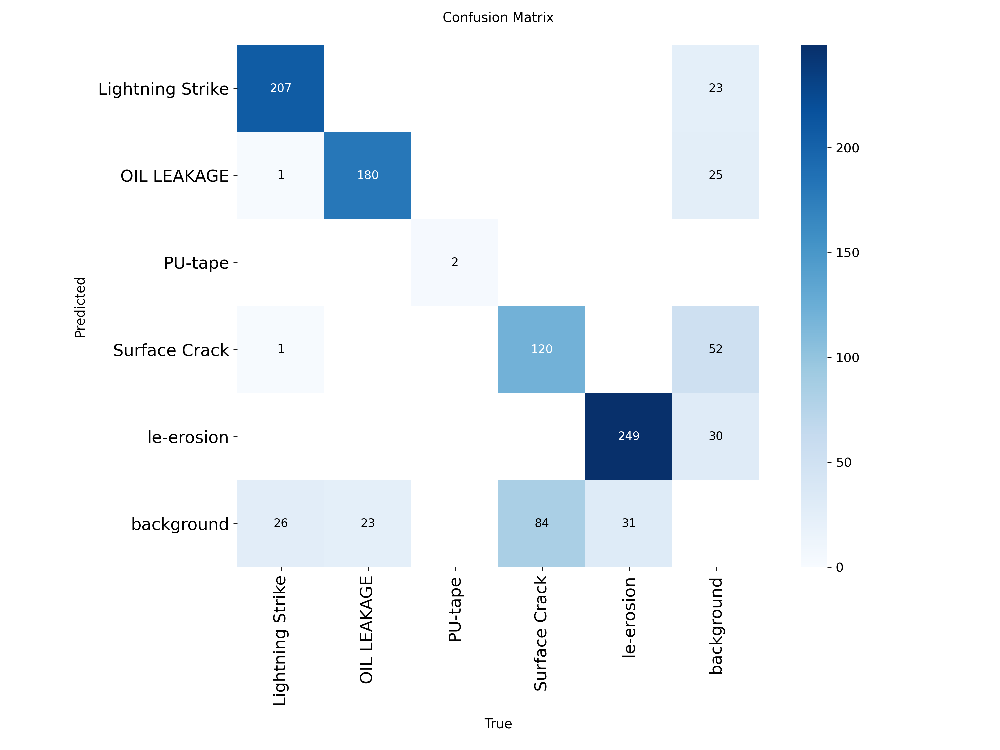

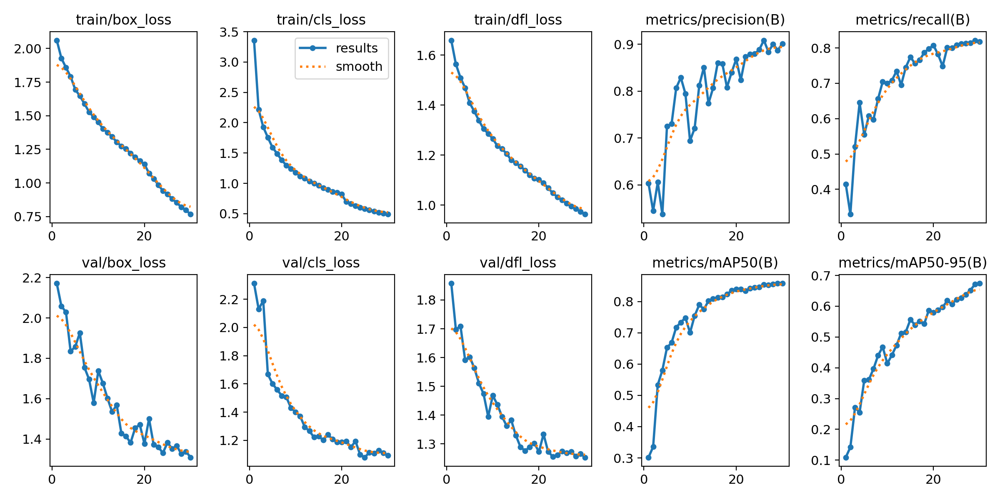

In [ ]:
# Lauren's Code — Evaluation for 5-Class Oversampled + Augmented Model (No Drain/Paint/Dirt)

from ultralytics import YOLO
from IPython.display import Image, display
from pathlib import Path
import numpy as np

# Root for 5-class dataset (no drain, paint, dirt)
root_5 = Path("/content/wind-combined-2_5class_nodrain_paint_dirt")

# YAML that points to the oversampled train list
yaml_5_oversampled_path = root_5 / "data_5class_oversampled_max.yaml"

# Name of the training run for Model 6 (must match the *training* cell)
run_name = "train_lauren_5class_oversampled_max_nodrainpaintdirt"
run_dir = Path("runs/detect") / run_name
weights_path = run_dir / "weights" / "best.pt"

print("Loading 5-class oversampled + augmented model from:", weights_path)
print("Using YAML:", yaml_5_oversampled_path)

# 1) Load best weights and run numeric eval
model_eval_6 = YOLO(str(weights_path))
metrics_6 = model_eval_6.val(data=str(yaml_5_oversampled_path))

print("\n=== Lauren 5-Class Oversampled + Augmented Model (No Drain/Paint/Dirt) — Numeric Metrics ===")
print("mAP50-95:", metrics_6.box.map)
print("mAP50   :", metrics_6.box.map50)
print("mAP75   :", metrics_6.box.map75)
print("Precision:", metrics_6.box.p)
print("Recall   :", metrics_6.box.r)
print("False alarm rate   :", 1 - metrics_6.box.p)
print("Missed damage rate :", 1 - metrics_6.box.r)

# 2) Visual metrics: confusion matrix + training curves
print("\n=== Visual Metrics ===")
cm_path = run_dir / "confusion_matrix.png"
res_path = run_dir / "results.png"

if cm_path.exists():
    display(Image(filename=str(cm_path), width=600))
else:
    print("No confusion_matrix.png found at", cm_path)

if res_path.exists():
    display(Image(filename=str(res_path), width=600))
else:
    print("No results.png found at", res_path)


In [ ]:
# 3) Severity-based evaluation (severe vs not-severe)
# 5-class mapping (same as Model 5):
#   0: Lightning Strike  -> severe
#   1: OIL LEAKAGE       -> non-severe
#   2: PU-tape           -> non-severe
#   3: Surface Crack     -> severe
#   4: le-erosion        -> severe

cm_obj = getattr(metrics_6, "confusion_matrix", None)

if cm_obj is not None and getattr(cm_obj, "matrix", None) is not None:
    cm_mat = cm_obj.matrix  # shape: (5, 5), rows = true, cols = pred

    severe_ids    = [0, 3, 4]
    nonsevere_ids = [1, 2]

    severe_idx    = np.ix_(severe_ids, severe_ids)
    severe_to_non = np.ix_(severe_ids, nonsevere_ids)
    non_to_severe = np.ix_(nonsevere_ids, severe_ids)
    non_to_non    = np.ix_(nonsevere_ids, nonsevere_ids)

    # Collapse 5x5 → 2x2
    TP = float(cm_mat[severe_idx].sum())      # true severe → predicted severe
    FN = float(cm_mat[severe_to_non].sum())   # true severe → predicted non-severe
    FP = float(cm_mat[non_to_severe].sum())   # true non-severe → predicted severe
    TN = float(cm_mat[non_to_non].sum())      # true non-severe → predicted non-severe

    precision_severe = TP / (TP + FP) if (TP + FP) > 0 else float("nan")
    recall_severe    = TP / (TP + FN) if (TP + FN) > 0 else float("nan")
    f1_severe        = (
        2 * precision_severe * recall_severe / (precision_severe + recall_severe)
        if (precision_severe + recall_severe) > 0 else float("nan")
    )

    print("\n=== Severe vs Not-Severe Confusion (5-Class, Instance-Level, Oversampled Model) ===")
    print("               Pred Severe   Pred Not-Severe")
    print(f"True Severe    {int(TP):10d}   {int(FN):15d}")
    print(f"True Not-Sev   {int(FP):10d}   {int(TN):15d}")

    print("\n=== Severe-Class Metrics (treating 'severe' as positive) ===")
    print(f"Precision_severe : {precision_severe:.3f}")
    print(f"Recall_severe    : {recall_severe:.3f}")
    print(f"F1_severe        : {f1_severe:.3f}")
else:
    print("\nNo in-memory confusion matrix available on metrics_6.")



=== Severe vs Not-Severe Confusion (5-Class, Instance-Level, Oversampled Model) ===
               Pred Severe   Pred Not-Severe
True Severe           578                 0
True Not-Sev            1               182

=== Severe-Class Metrics (treating 'severe' as positive) ===
Precision_severe : 0.998
Recall_severe    : 1.000
F1_severe        : 0.999
